# 

In [1]:
import comet_ml
from comet_ml.api import Parameter
COMET_KEY = 'w4JbvdIWlas52xdwict9MwmyH'
COMET_WORKSPACE = 'alainray'
api = comet_ml.api.API(api_key=COMET_KEY)
experiments = api.get(COMET_WORKSPACE, project_name='spur')
#experiments = [exp for exp in experiments if 'selected' in exp.get_tags()]

In [2]:
# For filtering experiments
from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display, HTML
# Assumes input is list of lists
def plot_line_data(xvals, means, stds, captions=[], title="",ylabel='Accuracy (%)'):

    # Create a plot with the line chart and shaded area
    fig, ax = plt.subplots()

    for x, y, std,c in zip(xvals, means, stds,captions):
        ax.plot(x, y,label=c)
        ax.fill_between(x, y - std, y + std, alpha=0.2)

    # Add labels and title
    ax.set_xlabel('Iteration')
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend()

    # Show the plot
    #plt.show()
    return fig
    
def get_all_steps(r):
    data = defaultdict(list)
    for k, v in r.items():
        print(k,v)
        data[v[1]].append(v[0])
    return data

def mean_exps(exps, metrics=["acc"]): # exps: list of APIExperiment
    results = {m: [] for m in metrics}
    for exp in exps:
        for m in metrics:
            results[m].append(get_metric(exp,m))
            #print(get_metric(exp,m))
    
    data = defaultdict(list)
    for metric, values in results.items():
        for seed_values in values:
            for seed_val, step_val in seed_values:
                data[step_val].append(float(seed_val))
    x = list(data.keys())
    means = np.array([np.mean(v) for k, v in data.items()])
    stds = np.array([np.std(v) for k, v in data.items()])
    
    return x, means, stds

def mean_exps1(exps, metrics=["acc"]):
    results = {m: [] for m in metrics}
    for exp in exps:
        for m in metrics:
            results[m].append(get_metric(exp, m))

    data = defaultdict(list)
    for metric, values in results.items():
        for seed_values in values:
            # unpack seed_values into separate arrays of step_values and seed_values
            step_values, seed_values = zip(*seed_values)
            # append seed_values to the corresponding step_values in the data dictionary
            data.update({step_val: data[step_val] + [seed_val] for step_val, seed_val in zip(step_values, seed_values)})

    # compute means and standard deviations for each step value
    x = sorted(data.keys())
    means = np.array([np.mean(data[k]) for k in x])
    stds = np.array([np.std(data[k]) for k in x])
    
    return x, means, stds

def filter_experiments(exps, params):
    l = []
    for exp in exps:
        if check_params(exp, params):
            l.append(exp)
    return l

def check_params(exp, params):
    names = [p[0] for p in params] # parameter names to filter
    for p in exp.get_parameters_summary():
        
        for param in params: # Check to see if parameter exists, if it doesn't, filter out experiment    
            # Check if any of the values matches
            #print(p['name'], param[0])
            if p['name'] == param[0]:
             #   print("HOLA")
                if p['valueCurrent'] not in param[1]:
                    return False
            
    return True

def group_experiments(experiments, column): # Groups experiments over 1 column, returns a dict with values of column as key
    result = defaultdict(list)
    for exp in experiments:
        params = exp.get_parameters_summary()
        for param in params:
            if param['name'] == column:
                result[param['valueCurrent']].append(exp)                                                   
    return result

def get_metric(exp, m):
    mode = 'play' if 'play' in m else 'train'
    results = []
    for l in exp.get_metrics():
        if l['metricName'] == m:
            #print(l)
            results.append((l['metricValue'],l['step'] if mode == 'play' else l['epoch']))
            
    return results

def get_parameter_value(exp, p):
    for l in exp.get_parameters_summary():
        if l['name'] == p:
            #print(l)
            return(l['valueCurrent'])
    return -1

def pack_results(r):
    xvals = []
    means = []
    stds = []
    captions = []
    for k,(x,m,s) in r.items():
        xvals.append(x)
        means.append(m)
        stds.append(s)
        captions.append(k)
        
    return xvals, means, stds, captions

def plot_metric(exps, metrics=['acc'], title=""):
    # Select metric
    r = dict()
    for k in E.keys():
        r[k] = mean_exps(E[k], metrics)
    plot_line_data(*pack_results(r), title=title)
    
def process_data(exps,metrics=['acc']):
    r = dict()
    for k in E.keys():
        r[k] = mean_exps(E[k], metrics)

    return pack_results(r)


def create_table(trainData, testData, plot_captions=None):
    table = defaultdict(dict)
    iters = trainData[0]
    trData = trainData[1]
        
    if plot_captions == 'corr':
        corr = [2*float(p) - 1 for p in trainData[-1]]
    elif plot_captions == 'pretrained':
        corr = [2*float(float(p.split("_")[2])) - 1 for p in trainData[-1]]
    else:
        corr = [p for p in trainData[-1]]
    tsData = testData[1]

    for its, c, tr, ts  in zip(iters, corr, trData, tsData):
        table[c]['train'] = np.max(tr)
        table[c]['test'] = np.max(ts)
        table[c]['delta'] = table[c]['train'] - table[c]['test']
        timeTo = np.argwhere(tr > 90)
        timeTo = int(timeTo[0]) if len(timeTo) > 0 else -1
        table[c]['time to 90% - train'] = its[timeTo]- 1
        timeTo = np.argwhere(ts > 90)
        timeTo = int(timeTo[0]) if len(timeTo) > 0 else -1
        table[c]['time to 90% - test'] = its[timeTo]- 1
        table[c]['slowdown'] = 100*(table[c]['time to 90% - test']-table[c]['time to 90% - train'])/float(table[c]['time to 90% - train'])

    return pd.DataFrame.from_dict(table, orient='index')

# Baseline Behaviour

## 1. Can we forget spurious features at all through training?

### 1.a) Pretrained on CMNIST, Trained on MNIST to convergence.
Check results on CMNIST test set

In [46]:
experiments = api.query(COMET_WORKSPACE, 'spur', 
                      (Parameter('model') == 'scnn')
                      & (Parameter('train_dataset') == 'cmnist') 
                      & (Parameter('play_dataset') == 'cmnist')
                      & (Parameter('load_pretrained') == 'true')
                      & (Parameter('frozen_features') == 'false') 
                      & (Parameter('train_baseline') == 'true') 
                      & (Parameter('play_baseline') == 'false')
                       )

f_exps = experiments
print(len(experiments))

18


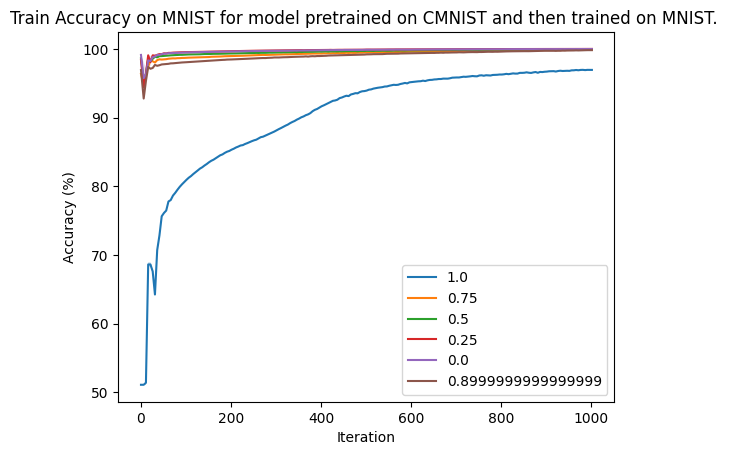

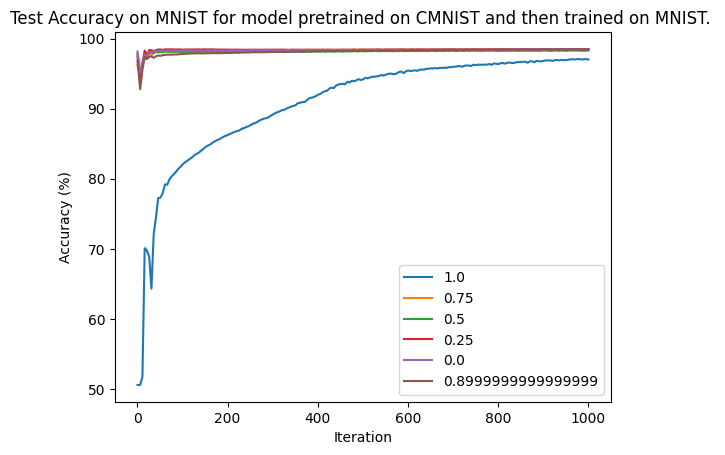

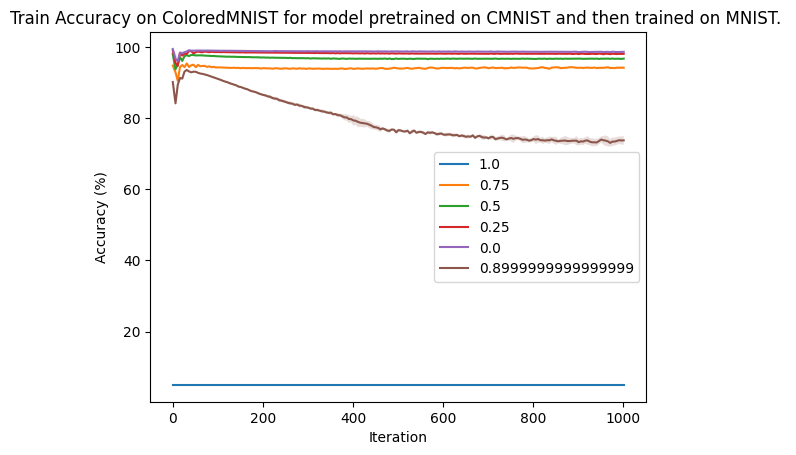

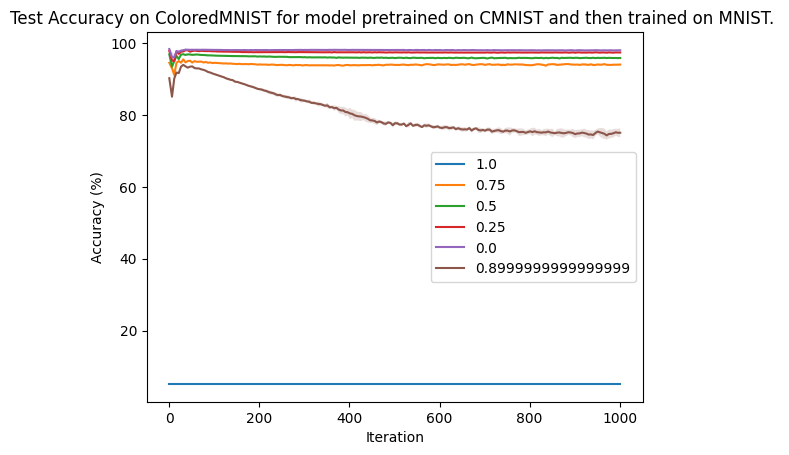

In [48]:
# Group by column
E = group_experiments(f_exps, 'pretrained_path')
trainData = process_data(E, ['train_train-train_acc'])
testData = process_data(E, ['train_train-test_acc'])
playtrainData = process_data(E, ['train_play-train_acc'])
playtestData = process_data(E, ['train_play-test_acc'])
captionsTrain = [float(k.split('_')[1])*2-1 for k in trainData[-1]]
captionsTest = [float(k.split('_')[1])*2-1 for k in testData[-1]]
plot_line_data(trainData[0],trainData[1],trainData[2], captionsTrain, title="Train Accuracy on MNIST for model pretrained on CMNIST and then trained on MNIST. ")
plot_line_data(testData[0],testData[1],testData[2], captionsTest, title="Test Accuracy on MNIST for model pretrained on CMNIST and then trained on MNIST. ")
plot_line_data(playtrainData[0],playtrainData[1],playtrainData[2], captionsTrain, title="Train Accuracy on ColoredMNIST for model pretrained on CMNIST and then trained on MNIST. ")
plot_line_data(playtestData[0],playtestData[1],playtestData[2], captionsTest, title="Test Accuracy on ColoredMNIST for model pretrained on CMNIST and then trained on MNIST. ")

## 1. Can we forget spurious features at all through training?

### 1.a) Pretrained on CMNIST, Trained on MNIST to convergence.
Check results on CMNIST test set

In [46]:
experiments = api.query(COMET_WORKSPACE, 'spur', 
                      (Parameter('model') == 'scnn')
                      & (Parameter('train_dataset') == 'cmnist') 
                      & (Parameter('play_dataset') == 'cmnist')
                      & (Parameter('load_pretrained') == 'true')
                      & (Parameter('frozen_features') == 'false') 
                      & (Parameter('train_baseline') == 'true') 
                      & (Parameter('play_baseline') == 'false')
                       )

f_exps = experiments
print(len(experiments))

18


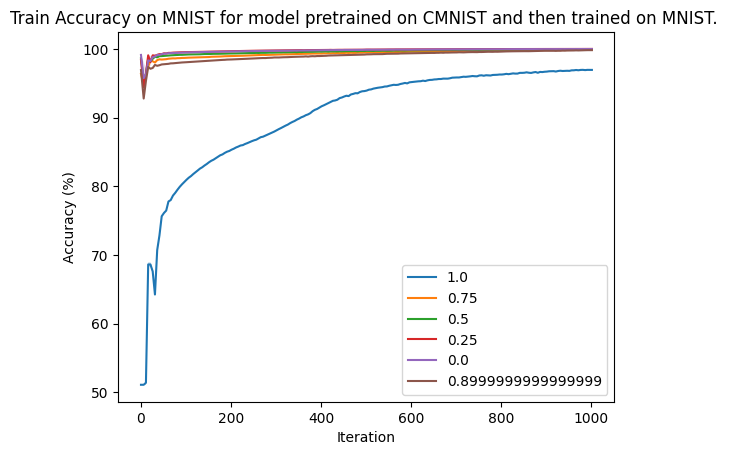

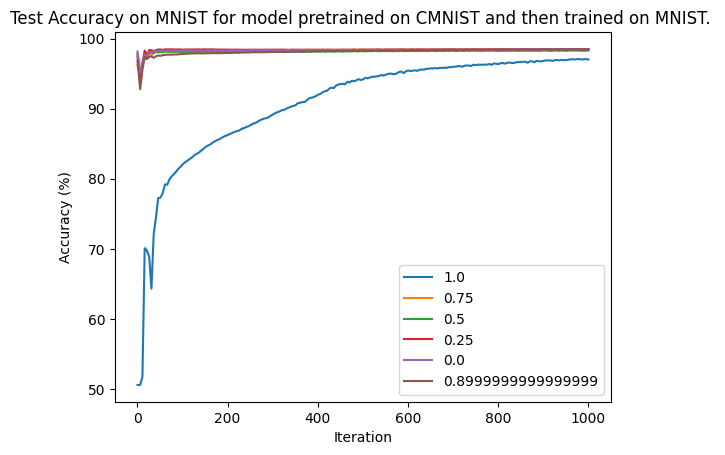

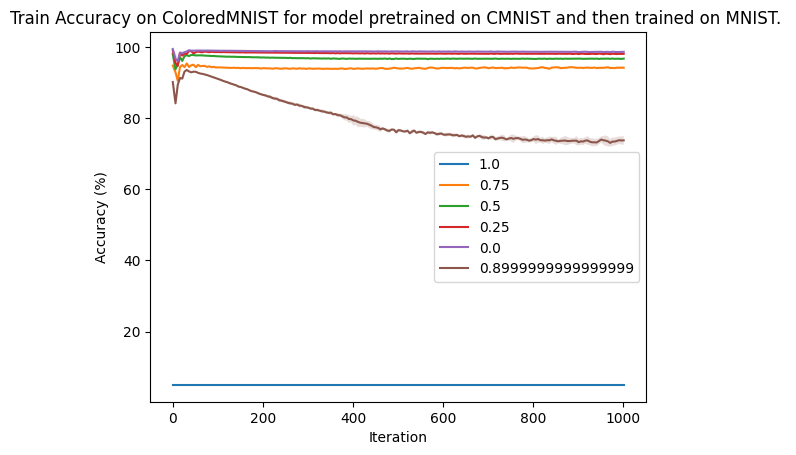

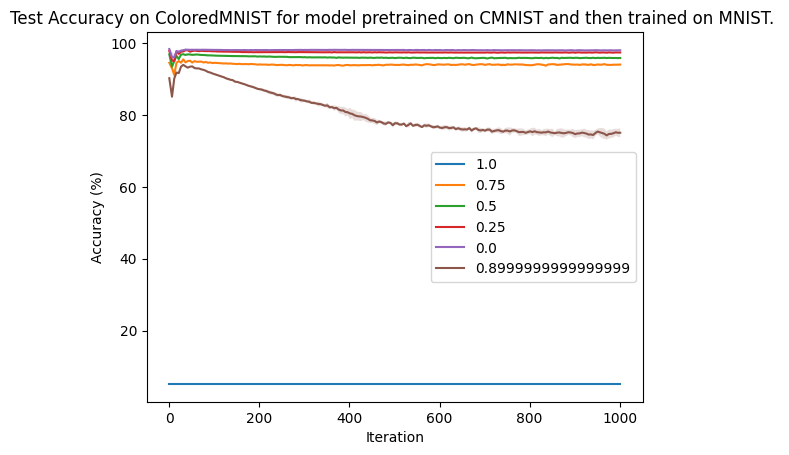

In [48]:
# Group by column
E = group_experiments(f_exps, 'pretrained_path')
trainData = process_data(E, ['train_train-train_acc'])
testData = process_data(E, ['train_train-test_acc'])
playtrainData = process_data(E, ['train_play-train_acc'])
playtestData = process_data(E, ['train_play-test_acc'])
captionsTrain = [float(k.split('_')[1])*2-1 for k in trainData[-1]]
captionsTest = [float(k.split('_')[1])*2-1 for k in testData[-1]]
plot_line_data(trainData[0],trainData[1],trainData[2], captionsTrain, title="Train Accuracy on MNIST for model pretrained on CMNIST and then trained on MNIST. ")
plot_line_data(testData[0],testData[1],testData[2], captionsTest, title="Test Accuracy on MNIST for model pretrained on CMNIST and then trained on MNIST. ")
plot_line_data(playtrainData[0],playtrainData[1],playtrainData[2], captionsTrain, title="Train Accuracy on ColoredMNIST for model pretrained on CMNIST and then trained on MNIST. ")
plot_line_data(playtestData[0],playtestData[1],playtestData[2], captionsTest, title="Test Accuracy on ColoredMNIST for model pretrained on CMNIST and then trained on MNIST. ")

### 1.b) Trained on MNIST, tested on ColoredMNIST

Testing how a model trained on shape features behaves on ColoredMNIST for different levels of spurious correlations.

In [136]:
experiments = api.query(COMET_WORKSPACE, 'spur', 
                      (Parameter('model') == 'scnn')
                      & (Parameter('train_dataset') == 'cmnist') 
                      & (Parameter('play_dataset') == 'cmnist') 
                      &(Parameter('train_baseline') == 'true')
                      & (Parameter('play_baseline') == 'false')
                       )
f_exps = experiments
len(experiments)

18

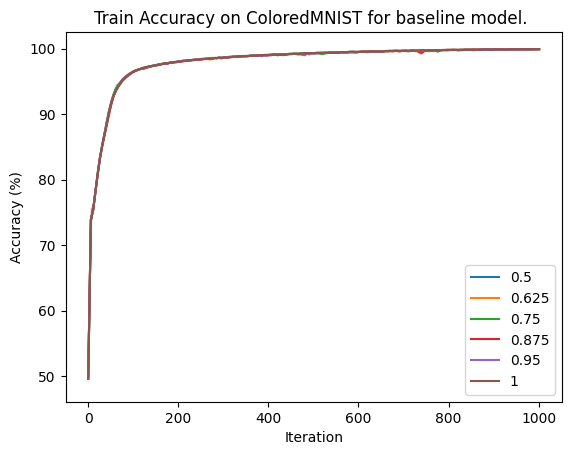

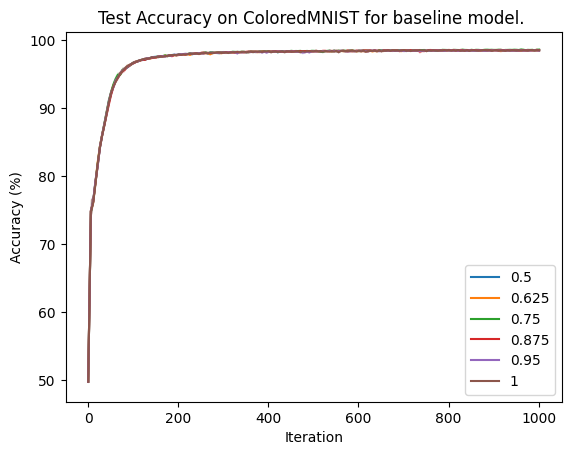

In [138]:
# Group by column
E = group_experiments(f_exps, 'spurious_probability')
trainData = process_data(E, ['train_train-train_acc'])
testData = process_data(E, ['train_train-test_acc'])
plot_line_data(*trainData, title="Train Accuracy on ColoredMNIST for baseline model. ")
plot_line_data(*testData, title="Test Accuracy on ColoredMNIST for baseline model. ")

In [140]:
df = create_table(trainData, testData)
df.style.format({
    'slowdown': '{:,.1f}%'.format})

,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,99.951996,98.553329,1.398666,45,45,0.0%
0.250000,99.940666,98.533328,1.407338,45,45,0.0%
0.500000,99.945999,98.653328,1.292671,45,45,0.0%
0.750000,99.924665,98.596662,1.328003,50,45,-10.0%
0.900000,99.941996,98.533328,1.408669,45,45,0.0%
1.000000,99.957331,98.583328,1.374003,45,45,0.0%


The model trained with correct features is basically immune to changes in spurious correlations at test time.

### 1.c) Trained on ColoredMNIST, tested on Colored MNIST (Actual Baseline)

In [54]:
experiments = api.query(COMET_WORKSPACE, 'spur', 
                      (Parameter('model') == 'scnn')
                      & (Parameter('train_dataset') == 'cmnist') 
                      & (Parameter('play_dataset') == 'cmnist') 
                      & (Parameter('train_baseline') == 'false') 
                     & (Parameter('play_baseline') == 'false')
                       )
#experiments = api.get(COMET_WORKSPACE, project_name='spur', query=filters)
#criteria = [('model', ['mlp','scnn'])] # Should be tuples = (fieldValue, list of values)
f_exps = experiments
#f_exps = filter_experiments(experiments, criteria)
print(len(experiments))

18


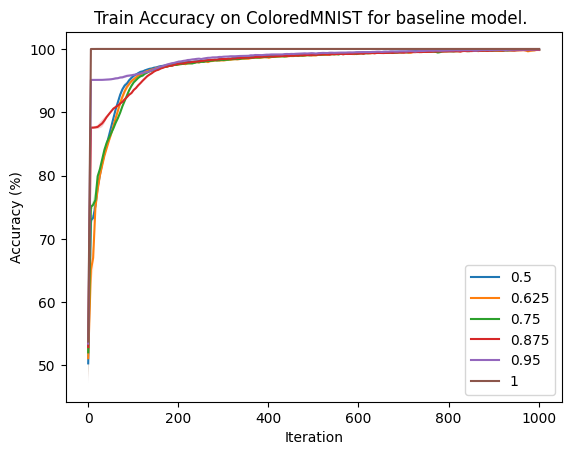

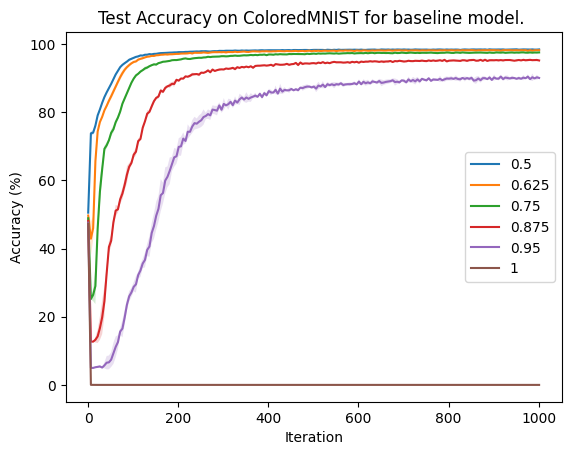

In [61]:
# Group by column
E = group_experiments(f_exps, 'spurious_probability')
trainData = process_data(E, ['train_train-train_acc'])
testData = process_data(E, ['train_train-test_acc'])
plot_line_data(*trainData, title="Train Accuracy on ColoredMNIST for baseline model. ")
plot_line_data(*testData, title="Test Accuracy on ColoredMNIST for baseline model. ")

In [134]:
df = create_table(trainData, testData)
df.style.format({
    'slowdown': '{:,.1f}%'.format})

,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,99.908663,98.456662,1.452001,60,60,0.0%
0.250000,99.855998,98.219996,1.636002,65,70,7.7%
0.500000,99.865334,97.556664,2.308670,75,105,40.0%
0.750000,99.841331,95.389999,4.451332,50,215,330.0%
0.900000,99.912666,90.443334,9.469332,5,815,"16,200.0%"
1.000000,100.000000,47.293331,52.706669,5,1000,"19,900.0%"


## 2. Can we focus on what to forget?

### 2.a) Spurious Frozen features for relearning MNIST

In [61]:
experiments = api.query(COMET_WORKSPACE, 'spur', 
                      (Parameter('model') == 'scnn')
                      & (Parameter('train_dataset') == 'cmnist') 
                      & (Parameter('play_dataset') == 'cmnist')
                      & (Parameter('load_pretrained') == 'true')
                      & (Parameter('frozen_features') == 'true') 
                      & (Parameter('train_baseline') == 'true') 
                      & (Parameter('play_baseline') == 'false')
                       )

f_exps = experiments
print(len(experiments))

18


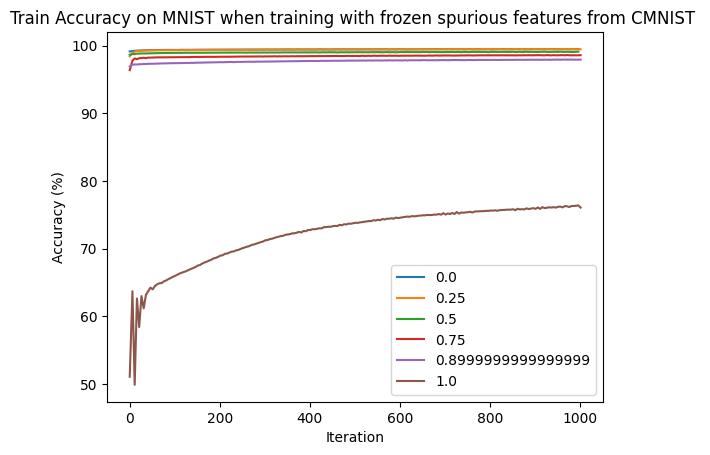

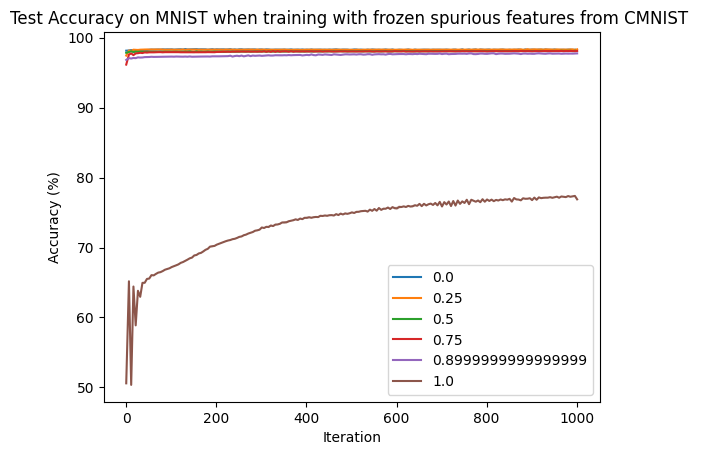

In [62]:
# Group by column
E = group_experiments(f_exps, 'pretrained_path')
trainData = process_data(E, ['train_train-train_acc'])
testData = process_data(E, ['train_train-test_acc'])
captionsTrain = [float(k.split('_')[1])*2-1 for k in trainData[-1]]
captionsTest = [float(k.split('_')[1])*2-1 for k in testData[-1]]
plot_line_data(trainData[0],trainData[1],trainData[2], captionsTrain, title="Train Accuracy on MNIST when training with frozen spurious features from CMNIST ")
plot_line_data(testData[0],testData[1],testData[2], captionsTest, title="Test Accuracy on MNIST when training with frozen spurious features from CMNIST ")


## SymMNIST

|  | NO BG | GRADIENT | IMAGES |
| --- | --- | --- | --- |

| Corr    |Train|Val|Test|Train|Val|Test|Train|Val|Test|
| ---|---|---|---|---|---|---|---|---|---|
|0   |Train|Val|Test|Train|Val|Test|Train|Val|Test|
|0.25|Train|Val|Test|Train|Val|Test|Train|Val|Test|
|0.5|Train|Val|Test|Train|Val|Test|Train|Val|Test|
|0.75|Train|Val|Test|Train|Val|Test|Train|Val|Test|
|0.9|Train|Val|Test|Train|Val|Test|Train|Val|Test|
|1|Train|Val|Test|Train|Val|Test|Train|Val|Test|

## 0. Performance of Baseline Models in all environments

In [3]:
envs = ['nobg','gradient','images']
#envs = ['nobg','nobg','nobg']
splits = ['train','val','test']
dfs = dict()

### 0.a) Trained on ColoredSynMNIST 

In [27]:
n_envs = len(envs)
n_splits = len(splits)

# get data first
all_data = dict()
for i, env in enumerate(envs):
    all_data[env] = dict()
    experiments = api.query(COMET_WORKSPACE, 'spur', 
                      (Parameter('model') == 'scnn')
                      & (Parameter('task_dataset_name') == 'synmnist') 
                      #& (Parameter('play_dataset') == 'cmnist')
                      & (Parameter('load_pretrained') == 'false')
                      & (Parameter('frozen_features') == 'false') 
                      & (Parameter('task_dataset_baseline') == 'false')
                      & (Parameter('task_dataset_bg') == env) 
                       )

    E = group_experiments(experiments, 'task_dataset_p')
    print(len(experiments))
    for j, split in enumerate(splits):
        # Get split data
        all_data[env][split] = process_data(E, [f'task_{split}_acc'])

6
6
6


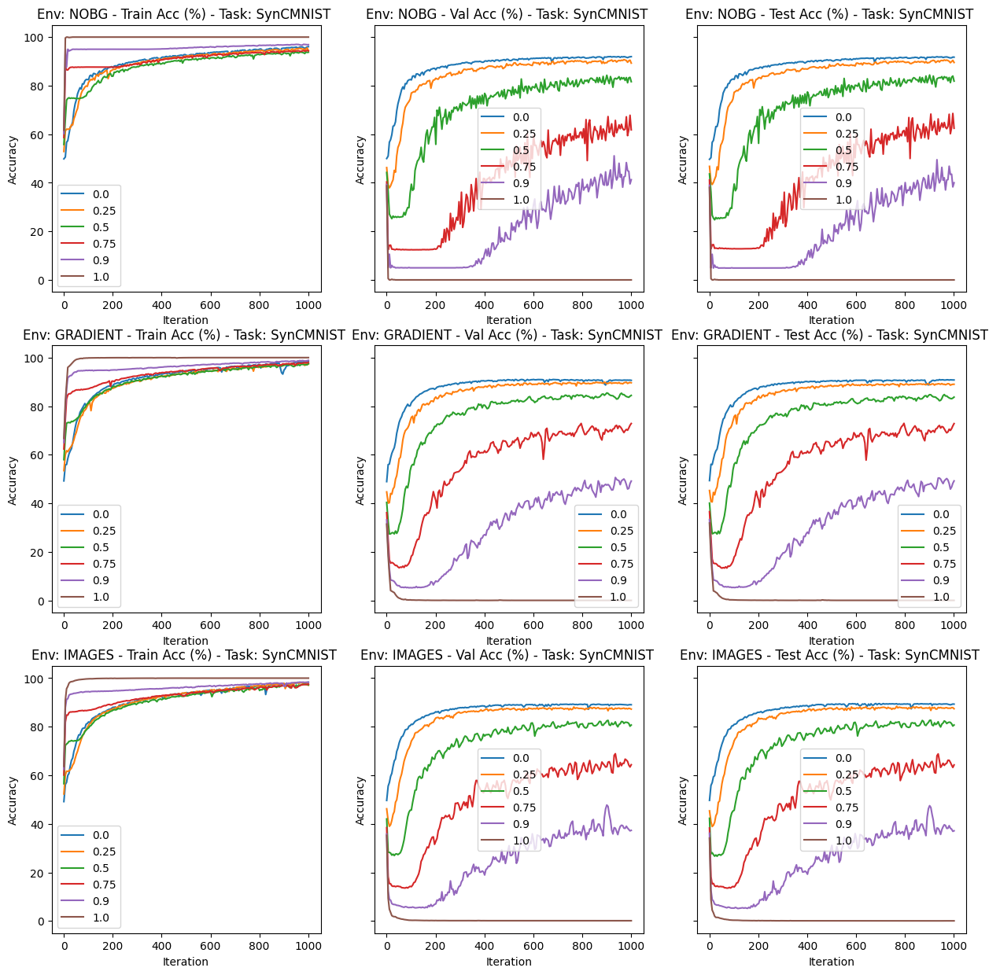

In [28]:
fig, axs = plt.subplots(n_envs, n_splits,figsize=(n_envs*5, n_splits*5), constrained_layout=False, sharey=True)
ylabel = 'Accuracy'
# plot data
for i, env in enumerate(envs):
    
    #print(len(experiments))
    # Group by column

    for j, split in enumerate(splits):
        data = all_data[env][split]
        xvals = data[0]
        means = data[1]
        stds = data[2]
        captions = [round(float(k)*2-1,3) for k in data[-1]]
        
        for x, y, std,c in zip(xvals, means, stds,captions):
            axs[i,j].plot(x, y,label=c)
            axs[i,j].fill_between(x, y - std, y + std, alpha=0.2)

        # Add labels and title
        axs[i,j].set_xlabel('Iteration')
        axs[i,j].set_ylabel(ylabel)
        axs[i,j].set_title(f"Env: {env.upper()} - {split.capitalize()} Acc (%) - Task: SynCMNIST ")
        axs[i,j].legend()

In [29]:
for env in envs:
    print(env.upper())
    df = create_table(all_data[env]['train'], all_data[env]['test'])
    df = df.style.format({'train': '{:,.1f}%'.format,
                          'test': '{:,.1f}%'.format,
                          'delta': '{:,.1f}%'.format,
                          'slowdown': '{:,.1f}%'.format})
    display(HTML(df.to_html()))

NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,96.1%,91.9%,4.1%,295,405,37.3%
0.250000,95.5%,90.6%,4.9%,340,760,123.5%
0.500000,93.9%,84.4%,9.5%,440,1000,127.3%
0.750000,94.5%,68.6%,25.9%,345,1000,189.9%
0.900000,97.0%,49.5%,47.5%,5,1000,"19,900.0%"
1.000000,100.0%,38.1%,61.9%,5,1000,"19,900.0%"


GRADIENT


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,98.4%,91.0%,7.4%,235,365,55.3%
0.250000,97.7%,89.3%,8.4%,285,1000,250.9%
0.500000,97.5%,84.8%,12.7%,275,1000,263.6%
0.750000,98.0%,72.9%,25.1%,180,1000,455.6%
0.900000,98.9%,50.4%,48.4%,15,1000,"6,566.7%"
1.000000,100.0%,31.9%,68.1%,15,1000,"6,566.7%"


IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,98.3%,89.6%,8.8%,280,1000,257.1%
0.250000,98.3%,88.4%,9.9%,285,1000,250.9%
0.500000,97.5%,82.7%,14.8%,310,1000,222.6%
0.750000,97.6%,68.8%,28.8%,220,1000,354.5%
0.900000,98.4%,47.5%,50.9%,10,1000,"9,900.0%"
1.000000,100.0%,34.1%,65.9%,5,1000,"19,900.0%"


### 0.b) Trained on SynMNIST (Black and White)

In [23]:
n_envs = len(envs)
n_splits = len(splits)

# get data first
all_data = dict()
for i, env in enumerate(envs):
    all_data[env] = dict()
    experiments = api.query(COMET_WORKSPACE, 'spur', 
                      (Parameter('model') == 'scnn')
                      & (Parameter('task_dataset_name') == 'synmnist') 
                      #& (Parameter('play_dataset') == 'cmnist')
                      & (Parameter('load_pretrained') == 'false')
                      & (Parameter('frozen_features') == 'false') 
                      & (Parameter('task_dataset_baseline') == 'true')
                      & (Parameter('task_dataset_bg') == env) 
                       )
    
    E = group_experiments(experiments, 'task_dataset_p')
    print(len(experiments))
    for j, split in enumerate(splits):
        # Get split data
        all_data[env][split] = process_data(E, [f'task_{split}_acc'])

dfs['baseline_BW_MNIST'] = all_data

6
6
6


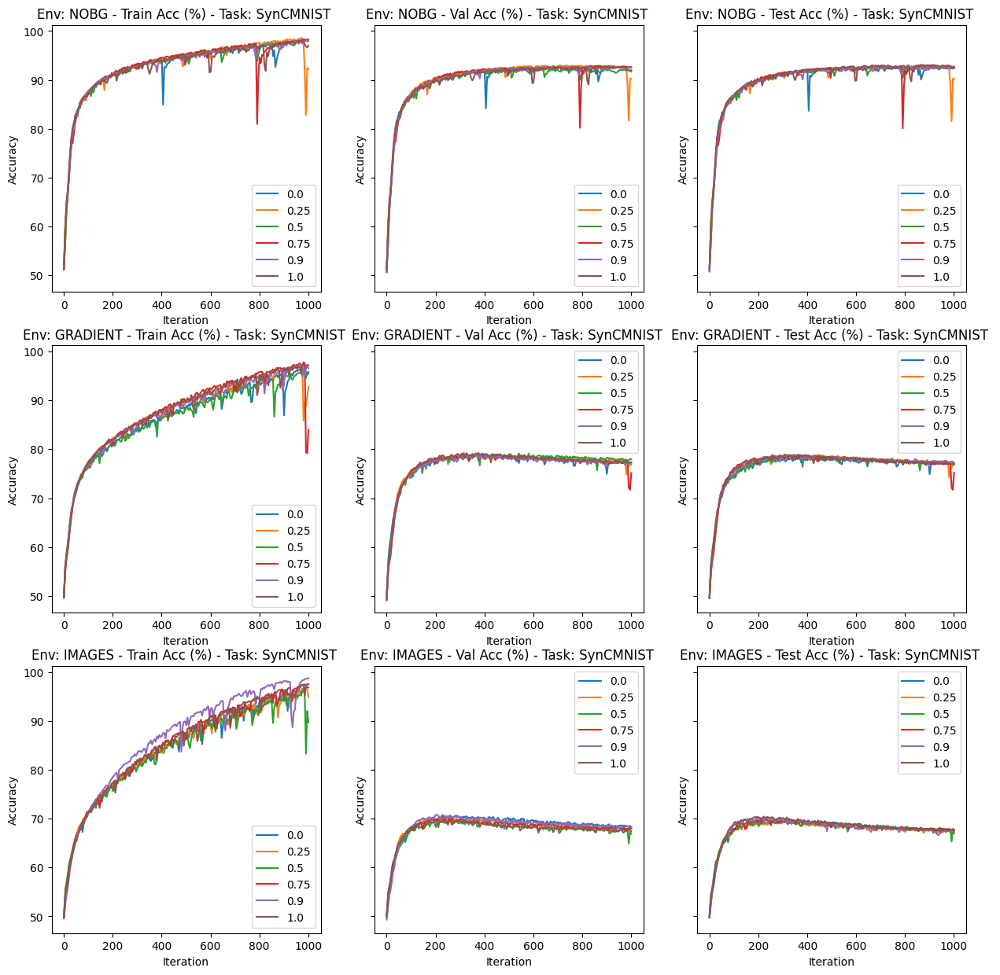

In [5]:
fig, axs = plt.subplots(n_envs, n_splits,figsize=(n_envs*5, n_splits*5), constrained_layout=False, sharey=True)
ylabel = 'Accuracy'
# plot data
for i, env in enumerate(envs):
    
    #print(len(experiments))
    # Group by column

    for j, split in enumerate(splits):
        data = all_data[env][split]
        xvals = data[0]
        means = data[1]
        stds = data[2]
        captions = [round(float(k)*2-1,3) for k in data[-1]]
        
        for x, y, std,c in zip(xvals, means, stds,captions):
            axs[i,j].plot(x, y,label=c)
            axs[i,j].fill_between(x, y - std, y + std, alpha=0.2)

        # Add labels and title
        axs[i,j].set_xlabel('Iteration')
        axs[i,j].set_ylabel(ylabel)
        axs[i,j].set_title(f"Env: {env.upper()} - {split.capitalize()} Acc (%) - Task: SynCMNIST ")
        axs[i,j].legend()

In [6]:
for env in envs:
    print(env.upper())
    df = create_table(all_data[env]['train'], all_data[env]['test'])
    df = df.style.format({'train': '{:,.1f}%'.format,
                          'test': '{:,.1f}%'.format,
                          'delta': '{:,.1f}%'.format,
                          'slowdown': '{:,.1f}%'.format})
    display(HTML(df.to_html()))

NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,98.2%,92.5%,5.7%,150,185,23.3%
0.250000,98.5%,92.8%,5.8%,155,200,29.0%
0.500000,98.2%,92.8%,5.4%,170,220,29.4%
0.750000,98.3%,92.8%,5.4%,155,195,25.8%
0.900000,98.1%,92.8%,5.3%,160,215,34.4%
1.000000,97.9%,93.1%,4.8%,185,205,10.8%


GRADIENT


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,96.2%,78.3%,17.9%,560,1000,78.6%
0.250000,97.3%,78.9%,18.3%,500,1000,100.0%
0.500000,95.8%,78.6%,17.2%,580,1000,72.4%
0.750000,97.8%,78.7%,19.1%,480,1000,108.3%
0.900000,97.2%,78.9%,18.3%,515,1000,94.2%
1.000000,97.4%,78.9%,18.5%,495,1000,102.0%


IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,96.9%,69.8%,27.1%,600,1000,66.7%
0.250000,96.6%,69.3%,27.3%,620,1000,61.3%
0.500000,96.1%,69.6%,26.5%,635,1000,57.5%
0.750000,97.5%,69.9%,27.6%,560,1000,78.6%
0.900000,98.8%,70.3%,28.4%,505,1000,98.0%
1.000000,97.5%,70.4%,27.1%,580,1000,72.4%


## 1. Can we forget spurious features at all through training?

### 1.a) Pretrained on CMNIST, Trained on MNIST to convergence.
Check results on CMNIST test set

In [51]:
n_envs = len(envs)
n_splits = len(splits)

# get data first
all_data = dict()
for i, env in enumerate(envs):
    all_data[env] = dict()
    experiments = api.query(COMET_WORKSPACE, 'spur', 
                      (Parameter('model') == 'scnn')
                      & (Parameter('task_dataset_name') == 'synmnist') 
                      #& (Parameter('play_dataset') == 'cmnist')
                      & (Parameter('load_pretrained') == 'true')
                      & (Parameter('pretrained_model_type') == None)
                      & (Parameter('frozen_features') == 'false') 
                      & (Parameter('task_dataset_baseline') == 'true')
                      & (Parameter('task_dataset_bg') == env) 
                       )
    
    E = group_experiments(experiments, 'pretrained_path')
    print(len(experiments))
    for j, split in enumerate(splits):
        # Get split data
        all_data[env][split] = process_data(E, [f'task_{split}_acc'])
dfs['baseline_unfrozen_nobs_MNIST'] = all_data

6
6
6


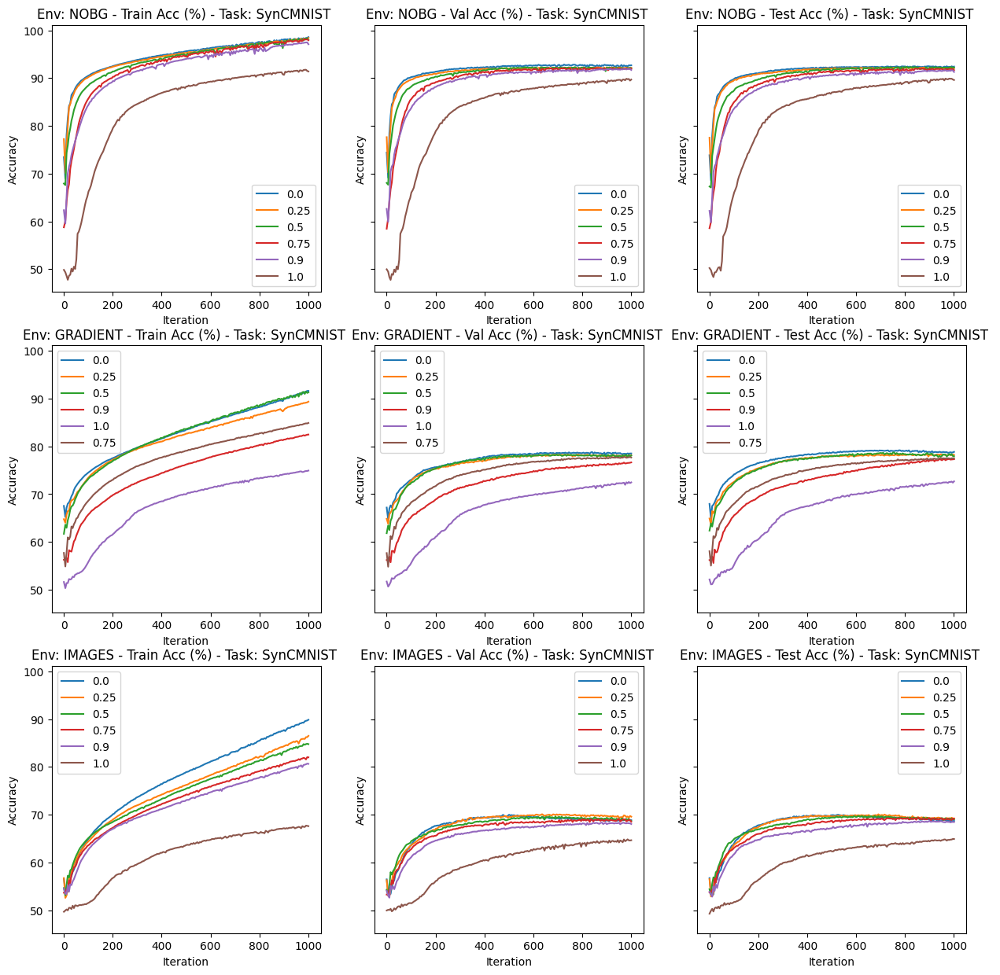

In [14]:
fig, axs = plt.subplots(n_envs, n_splits,figsize=(n_envs*5, n_splits*5), constrained_layout=False, sharey=True)
ylabel = 'Accuracy'
# plot data
for i, env in enumerate(envs):
    
    #print(len(experiments))
    # Group by column

    for j, split in enumerate(splits):
        data = all_data[env][split]
        xvals = data[0]
        means = data[1]
        stds = data[2]
        captions = [round(2*float(k.split("_")[2]) - 1,2) for k in data[-1]]
        
        for x, y, std,c in zip(xvals, means, stds,captions):
            axs[i,j].plot(x, y,label=c)
            axs[i,j].fill_between(x, y - std, y + std, alpha=0.2)

        # Add labels and title
        axs[i,j].set_xlabel('Iteration')
        axs[i,j].set_ylabel(ylabel)
        axs[i,j].set_title(f"Env: {env.upper()} - {split.capitalize()} Acc (%) - Task: SynCMNIST ")
        axs[i,j].legend()

In [15]:
for env in envs:
    print(env.upper())
    df = create_table(all_data[env]['train'], all_data[env]['test'], pretrained=True)
    df = df.style.format({'train': '{:,.1f}%'.format,
                          'test': '{:,.1f}%'.format,
                          'delta': '{:,.1f}%'.format,
                          'slowdown': '{:,.1f}%'.format})
    display(HTML(df.to_html()))

NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,98.6%,92.5%,6.1%,85,105,23.5%
0.250000,98.4%,92.2%,6.2%,95,125,31.6%
0.500000,98.3%,92.3%,6.0%,145,215,48.3%
0.750000,98.1%,92.0%,6.1%,200,295,47.5%
0.900000,97.5%,91.6%,5.8%,225,390,73.3%
1.000000,91.7%,89.9%,1.8%,700,1000,42.9%


GRADIENT


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,91.6%,79.2%,12.4%,910,1000,9.9%
0.250000,89.4%,78.4%,11.0%,1000,1000,0.0%
0.500000,91.5%,78.7%,12.8%,880,1000,13.6%
0.900000,82.5%,77.4%,5.1%,1000,1000,0.0%
1.000000,74.9%,72.7%,2.2%,1000,1000,0.0%
0.750000,84.9%,77.6%,7.3%,1000,1000,0.0%


IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,89.9%,70.0%,19.9%,1000,1000,0.0%
0.250000,86.5%,70.1%,16.4%,1000,1000,0.0%
0.500000,84.8%,69.7%,15.1%,1000,1000,0.0%
0.750000,82.0%,69.4%,12.6%,1000,1000,0.0%
0.900000,80.7%,68.7%,12.0%,1000,1000,0.0%
1.000000,67.7%,64.9%,2.8%,1000,1000,0.0%


### 1.b) Pretrained on MNIST, Trained on MNIST to convergence.
Check results on CMNIST test set

In [17]:
n_envs = len(envs)
n_splits = len(splits)

# get data first
all_data = dict()
for i, env in enumerate(envs):
    all_data[env] = dict()
    experiments = api.query(COMET_WORKSPACE, 'spur', 
                      (Parameter('model') == 'scnn')
                      & (Parameter('task_dataset_name') == 'synmnist') 
                      #& (Parameter('play_dataset') == 'cmnist')
                      & (Parameter('load_pretrained') == 'true')
                      & (Parameter('pretrained_model_type') == 'bs')
                      & (Parameter('frozen_features') == 'false') 
                      & (Parameter('task_dataset_baseline') == 'true')
                      & (Parameter('task_dataset_bg') == env) 
                       )
    
    E = group_experiments(experiments, 'pretrained_path')
    print(len(experiments))
    for j, split in enumerate(splits):
        # Get split data
        all_data[env][split] = process_data(E, [f'task_{split}_acc'])

6
6
6


### 1.c) Pretrained on CMNIST, Frozen Features Trained on MNIST to convergence.
Check results on CMNIST test set

In [24]:
n_envs = len(envs)
n_splits = len(splits)

# get data first
all_data = dict()
for i, env in enumerate(envs):
    all_data[env] = dict()
    experiments = api.query(COMET_WORKSPACE, 'spur', 
                      (Parameter('model') == 'scnn')
                      & (Parameter('task_dataset_name') == 'synmnist') 
                      #& (Parameter('play_dataset') == 'cmnist')
                      & (Parameter('load_pretrained') == 'true')
                      & (Parameter('pretrained_model_type') == 'nobs')
                      & (Parameter('frozen_features') == 'True') 
                      & (Parameter('task_dataset_baseline') == 'true')
                      & (Parameter('task_dataset_bg') == env) 
                       )
    
    E = group_experiments(experiments, 'pretrained_path')
    print(len(experiments))
    for j, split in enumerate(splits):
        # Get split data
        all_data[env][split] = process_data(E, [f'task_{split}_acc'])

dfs['baseline_frozen_nobs_MNIST'] = all_data

6
6
6


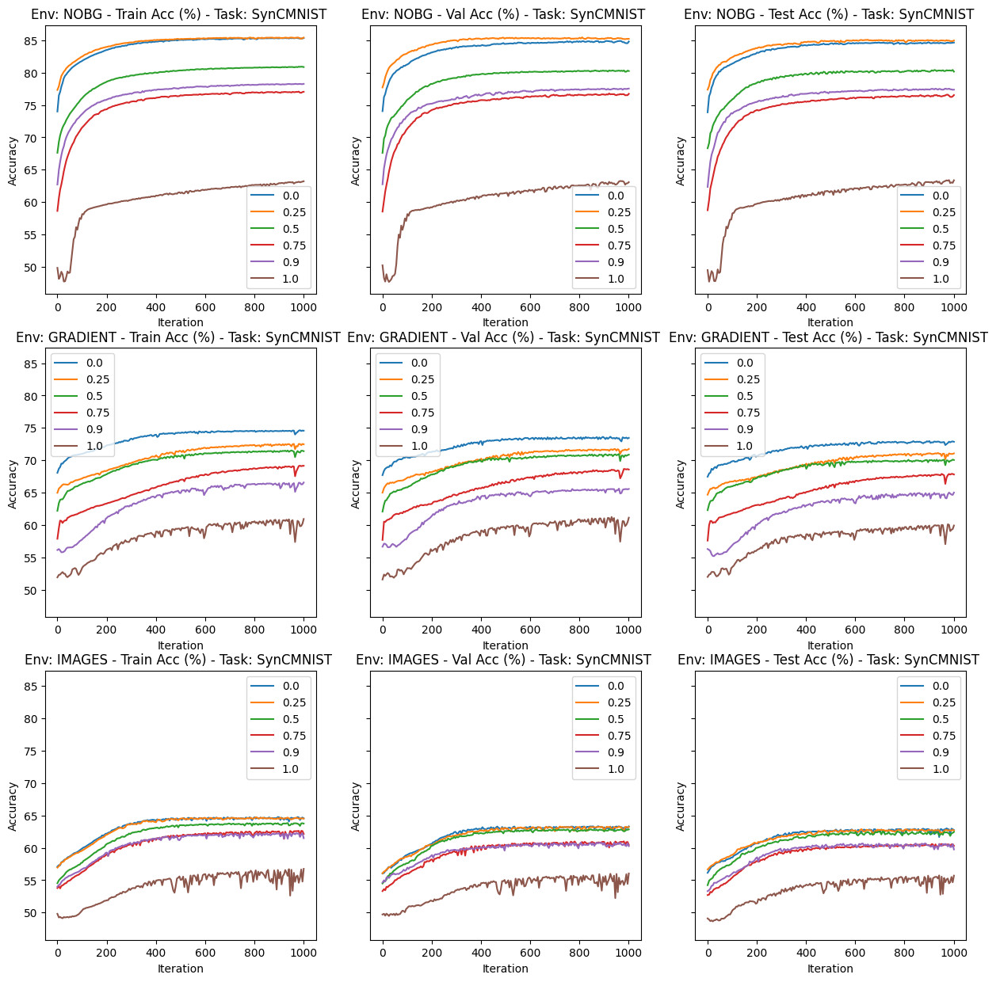

In [19]:
fig, axs = plt.subplots(n_envs, n_splits,figsize=(n_envs*5, n_splits*5), constrained_layout=False, sharey=True)
ylabel = 'Accuracy'
# plot data
for i, env in enumerate(envs):
    
    #print(len(experiments))
    # Group by column

    for j, split in enumerate(splits):
        data = all_data[env][split]
        xvals = data[0]
        means = data[1]
        stds = data[2]
        captions = [round(2*float(k.split("_")[2]) - 1,2) for k in data[-1]]
        
        for x, y, std,c in zip(xvals, means, stds,captions):
            axs[i,j].plot(x, y,label=c)
            axs[i,j].fill_between(x, y - std, y + std, alpha=0.2)

        # Add labels and title
        axs[i,j].set_xlabel('Iteration')
        axs[i,j].set_ylabel(ylabel)
        axs[i,j].set_title(f"Env: {env.upper()} - {split.capitalize()} Acc (%) - Task: SynCMNIST ")
        axs[i,j].legend()

In [20]:
for env in envs:
    print(env.upper())
    df = create_table(all_data[env]['train'], all_data[env]['test'], pretrained=True)
    df = df.style.format({'train': '{:,.1f}%'.format,
                          'test': '{:,.1f}%'.format,
                          'delta': '{:,.1f}%'.format,
                          'slowdown': '{:,.1f}%'.format})
    display(HTML(df.to_html()))

NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,85.4%,84.7%,0.7%,1000,1000,0.0%
0.250000,85.4%,85.1%,0.3%,1000,1000,0.0%
0.500000,80.9%,80.4%,0.5%,1000,1000,0.0%
0.750000,77.1%,76.6%,0.5%,1000,1000,0.0%
0.900000,78.3%,77.5%,0.7%,1000,1000,0.0%
1.000000,63.2%,63.4%,-0.2%,1000,1000,0.0%


GRADIENT


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,74.6%,73.0%,1.7%,1000,1000,0.0%
0.250000,72.5%,71.1%,1.4%,1000,1000,0.0%
0.500000,71.5%,70.1%,1.4%,1000,1000,0.0%
0.750000,69.2%,67.9%,1.3%,1000,1000,0.0%
0.900000,66.6%,65.0%,1.6%,1000,1000,0.0%
1.000000,60.9%,60.1%,0.8%,1000,1000,0.0%


IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,64.8%,63.0%,1.8%,1000,1000,0.0%
0.250000,64.7%,62.9%,1.8%,1000,1000,0.0%
0.500000,63.8%,62.5%,1.3%,1000,1000,0.0%
0.750000,62.6%,60.6%,2.0%,1000,1000,0.0%
0.900000,62.3%,60.7%,1.6%,1000,1000,0.0%
1.000000,56.7%,55.7%,1.0%,1000,1000,0.0%


In [ ]:
experiments = api.query(COMET_WORKSPACE, 'spur', 
                      (Parameter('model') == 'scnn')
                      & (Parameter('task_dataset') == 'synmnist') 
                      #& (Parameter('play_dataset') == 'cmnist')
                      & (Parameter('load_pretrained') == 'true')
                      & (Parameter('frozen_features') == 'false') 
                      & (Parameter('task_baseline') == 'false') 
                      & (Parameter('play_baseline') == 'false')
                      & (Parameter('play_baseline') == 'false')

In [41]:
trainData[-1]

['0.5', '0.625', '0.75', '0.875', '0.95']

### Missing performance from using trained spurious features

In [50]:
a = 'baseline_BW_MNIST'
b = 'baseline_frozen_nobs_MNIST'
res = dict()

df = pd.DataFrame()
for env in envs:
    dfa = create_table(dfs[a][env]['train'],dfs[a][env]['test'], pretrained=False)
    dfb = create_table(dfs[b][env]['train'],dfs[b][env]['test'], pretrained=True)
    df[env] = dfa['test'] -dfb['test']


print("Accuracy lost for freezing model features")
print(df.iloc[0])
print("Accuracy lost for using spurious features")
df = df - df.iloc[0]
df = df.style.format({'nobg': '{:,.1f}%'.format,
                      'gradient': '{:,.1f}%'.format,
                      'images': '{:,.1f}%'.format})

display(HTML(df.to_html()))

Accuracy lost for freezing model features
nobg        7.840004
gradient    5.314995
images      6.830002
Name: 0.0, dtype: float64
Accuracy lost for using spurious features


,nobg,gradient,images
0.000000,0.0%,0.0%,0.0%
0.250000,-0.2%,2.5%,-0.4%
0.500000,4.6%,3.2%,0.3%
0.750000,8.4%,5.5%,2.4%
0.900000,7.4%,8.6%,2.8%
1.000000,21.9%,13.5%,7.9%


In [59]:
a = 'baseline_BW_MNIST'
b = 'baseline_unfrozen_nobs_MNIST'
res = dict()

df = pd.DataFrame()
for env in envs:
    dfa = create_table(dfs[a][env]['train'],dfs[a][env]['test'], pretrained=False)
    dfb = create_table(dfs[b][env]['train'],dfs[b][env]['test'], pretrained=True)
#    print(env, dfa['test'], dfb['test'])
    df[env] = dfa['test'] -dfb['test']


print("Accuracy lost for freezing model features")
print(df.iloc[0])
print("Accuracy lost for using spurious features")
df = df - df.iloc[0]
df = df.style.format({'nobg': '{:,.1f}%'.format,
                      'gradient': '{:,.1f}%'.format,
                      'images': '{:,.1f}%'.format})

display(HTML(df.to_html()))

Accuracy lost for freezing model features
nobg        0.049995
gradient   -0.925011
images     -0.169998
Name: 0.0, dtype: float64
Accuracy lost for using spurious features


,nobg,gradient,images
0.000000,0.0%,0.0%,0.0%
0.250000,0.5%,1.5%,-0.6%
0.500000,0.4%,0.8%,0.1%
0.750000,0.8%,2.1%,0.6%
0.900000,1.1%,2.5%,1.8%
1.000000,3.2%,7.1%,5.7%


## Resumen

* Mayores niveles de correlaciones espurias tienden a generar peor performance inicialmente, el cual con el pasar del entrenamiento se reaprende, pero llegando a niveles de performance mas bajos. Es similar a entrenar con ruido en el input.
* No observamos por ejemplo un performance en test proporcional al nivel de correlacion espuria:
    * Por ejemplo con 0.9 de correlacion, vemos que performance es 50% en test, mientras que con 0.5 caemos a 84%.
* Features espurios tienden a ralentizar el aprendizaje mas que a negarlo completamente.
* Podemos sobreponernos a haber entrenado con datos espurios? Si, solo en los casos mas extremos de correlacion observamos perdida significativa de capacidad de generalizacion. Pero es lento y requiere significativo computo extra.
* En caso de utilizar features espurios congelados la diferencia en performance aumenta. Por ejemplo, pensando en usar feature extractos ya entrenados en Continual Learning.


## Forgetting

### 1 Layer: 10 interventions

In [5]:
envs = ['nobg','gradient','images']
#envs = ['nobg','nobg','nobg']
splits = ['train','val']
dfs = dict()

### Hyperparameter search

In [7]:
%%time
from copy import deepcopy
envs = ['nobg']
n_envs = len(envs)
n_splits = len(splits)
env = 'nobg'
# get data first



all_data = dict()
for n_inter in range(2,6):
    for asc in ['true','false']:
        all_data[env] = dict()
        experiments = api.query(COMET_WORKSPACE, 'spur', 
                          (Parameter('model') == 'scnn')
                          & (Parameter('task_dataset_name') == 'synmnist') 
                          & (Parameter('load_pretrained') == 'false')
                          & (Parameter('frozen_features') == 'false') 
                          & (Parameter('task_dataset_baseline') == 'false')
                          & (Parameter('task_n_interventions') == f"{n_inter}")
                          & (Parameter('forget_asc') == asc)
                          & (Parameter('task_dataset_bg') == 'nobg') 
                           )

        E = group_experiments(experiments, 'forget_method')
        print(len(experiments))
        for j, split in enumerate(splits):
            # Get split data
            all_data[env][split] = process_data(E, [f'task_{split}_acc'])

        dfs[f'baseline_forget_hyper_{n_inter}_{asc}_MNIST'] = deepcopy(all_data)

defaultdict(<class 'list'>, {'random': [<APIExperiment 'alainray/spur/7edb35d813484b9f986e8075ad64d5a3'>], 'partial': [<APIExperiment 'alainray/spur/99eac914834c41789d55895afbfaa940'>], 'full': [<APIExperiment 'alainray/spur/344bb55a0c36453cb7a3dc4f55f2ca1e'>]})
3
defaultdict(<class 'list'>, {'random': [<APIExperiment 'alainray/spur/e09ebc230702439ea5205f56f9a88912'>], 'partial': [<APIExperiment 'alainray/spur/c8fbc8b073d44ae0a17bc9c6d0537a67'>], 'full': [<APIExperiment 'alainray/spur/183d7c27606840e2952d1e6e6ffbd4c8'>]})
3
defaultdict(<class 'list'>, {'random': [<APIExperiment 'alainray/spur/c04e8c929dde4c2d8dbd1967a0653eb1'>], 'partial': [<APIExperiment 'alainray/spur/5139a0ffe2394997b81ff5c4a5b7effb'>], 'full': [<APIExperiment 'alainray/spur/e148be9d9a7243b2b888ace7620644cf'>]})
3
defaultdict(<class 'list'>, {'random': [<APIExperiment 'alainray/spur/f6cf46b384ab40c2b1608bfa36318aea'>], 'full': [<APIExperiment 'alainray/spur/83ccede92d0c417e87156aaa25cd3197'>], 'partial': [<APIExperi

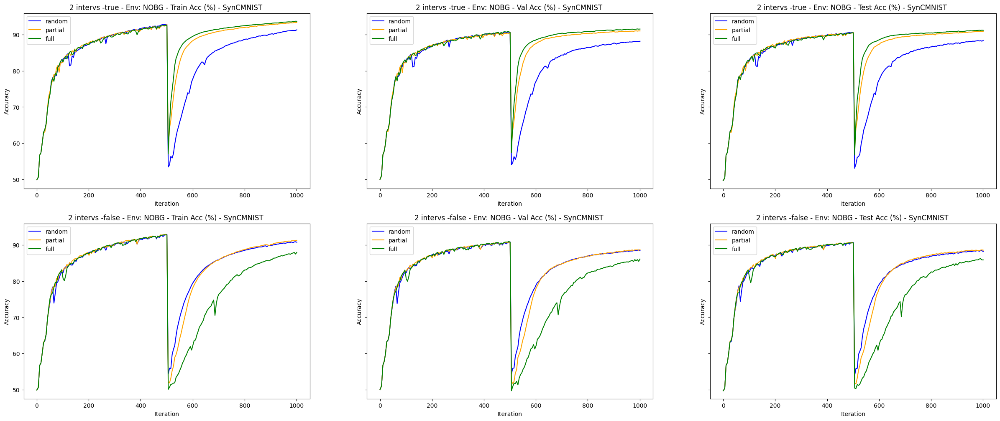

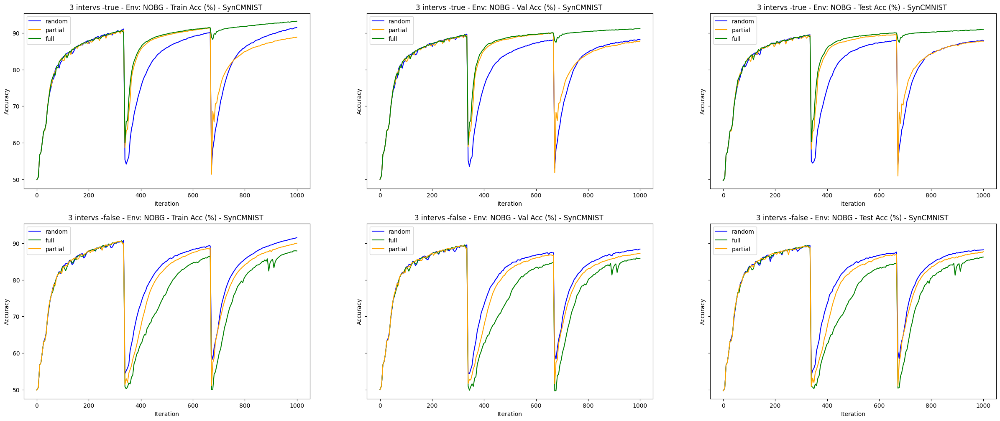

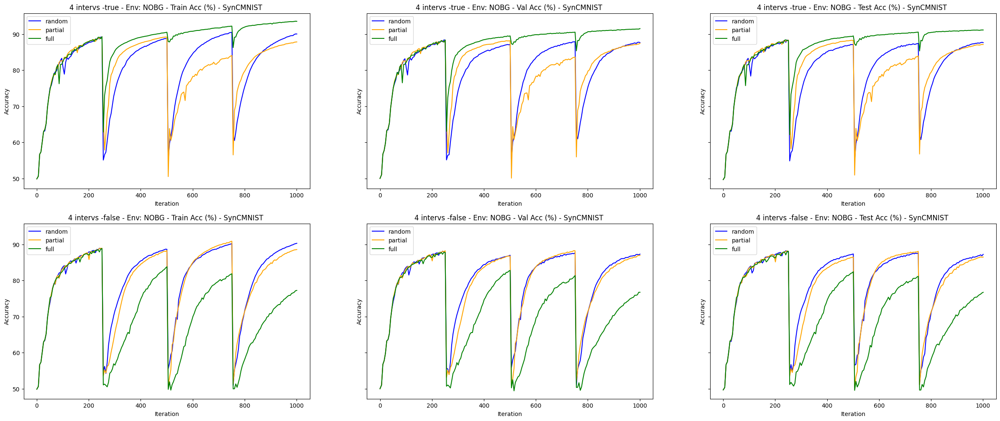

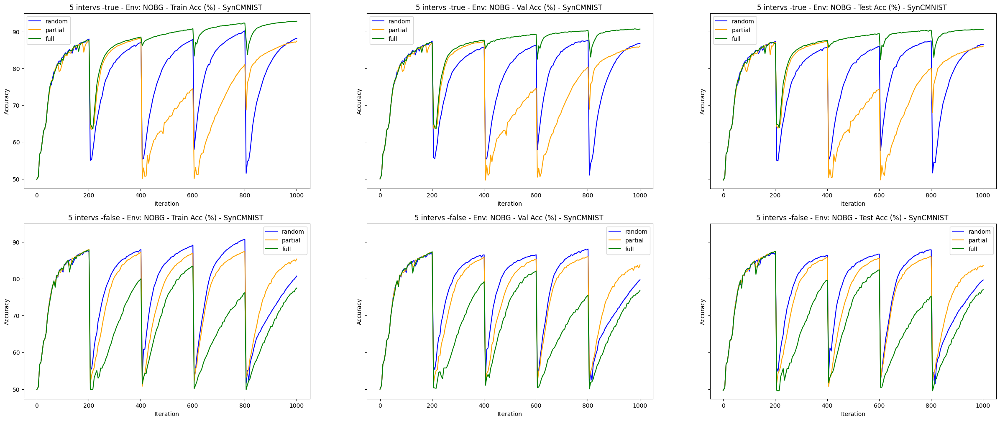

In [13]:
env = "nobg"
ylabel = 'Accuracy'
# plot data
colors = {'random': 'blue', 'full': 'green', 'partial': 'orange'}
for n_inter in range(2,6):
    fig, axs = plt.subplots(2, n_splits,figsize=(30, 4*n_splits), constrained_layout=False, sharey=True)

    for i, asc in enumerate(['true','false']):
        all_data = dfs[f'baseline_forget_hyper_{n_inter}_{asc}_MNIST'] 
        for j, split in enumerate(splits):
            data = all_data[env][split]
            xvals = data[0]
            means = data[1]
            stds = data[2]
            captions = [k for k in data[-1]]

            for x, y, std,c in zip(xvals, means, stds,captions):
                #for n in range(1, 11):
                #    axs[i,j].axvspan((n-1)*100, n*100, ymin=0, ymax=100, color=['lightblue','white'][n%2])
                axs[i,j].plot(x, y,label=c, color=colors[c])
                axs[i,j].fill_between(x, y - std, y + std, alpha=0.2)

               #     axs[i,j].axvline(x=n*100, ls='--')

            # Add labels and title
            axs[i,j].set_xlabel('Iteration')
            axs[i,j].set_ylabel(ylabel)
            axs[i,j].set_title(f"{n_inter} intervs -{asc} - Env: {env.upper()} - {split.capitalize()} Acc (%) - SynCMNIST ")
            axs[i,j].legend()

In [25]:

for method in ['random','full','partial','spur_grads']:
    for asc in ['true','false']:
        
        all_data = dfs[f'baseline_forget_hyper_{method}_{asc}_MNIST'] 
        print(f"{method}-{env.upper()}")
        df = create_table(all_data[env]['train'], all_data[env]['test'])
        df = df.style.format({'train': '{:,.1f}%'.format,
                              'test': '{:,.1f}%'.format,
                              'delta': '{:,.1f}%'.format,
                              'slowdown': '{:,.1f}%'.format})
        display(HTML(df.to_html()))

random-NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
2,92.9%,90.8%,2.1%,300,370,23.3%
3,90.6%,89.5%,1.1%,295,999,238.6%
4,88.9%,88.0%,0.9%,1000,1000,0.0%
5,87.6%,87.0%,0.6%,1000,1000,0.0%


random-NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
2,92.9%,90.8%,2.1%,300,370,23.3%
3,90.6%,89.5%,1.1%,295,999,238.6%
4,88.9%,88.0%,0.9%,1000,1000,0.0%
5,87.6%,87.0%,0.6%,1000,1000,0.0%


full-NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
2,92.9%,90.8%,2.1%,300,370,23.3%
3,90.6%,89.5%,1.1%,295,999,238.6%
4,88.9%,88.0%,0.9%,1000,1000,0.0%
5,87.6%,87.0%,0.6%,1000,1000,0.0%


full-NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
2,92.9%,90.8%,2.1%,300,370,23.3%
3,90.6%,89.5%,1.1%,295,999,238.6%
4,88.9%,88.0%,0.9%,1000,1000,0.0%
5,87.6%,87.0%,0.6%,1000,1000,0.0%


partial-NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
2,92.9%,90.8%,2.1%,300,370,23.3%
3,90.6%,89.5%,1.1%,295,999,238.6%
4,88.9%,88.0%,0.9%,1000,1000,0.0%
5,87.6%,87.0%,0.6%,1000,1000,0.0%


partial-NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
2,92.9%,90.8%,2.1%,300,370,23.3%
3,90.6%,89.5%,1.1%,295,999,238.6%
4,88.9%,88.0%,0.9%,1000,1000,0.0%
5,87.6%,87.0%,0.6%,1000,1000,0.0%


In [16]:

for n_inter in range(2,6):
    for asc in ['true','false']:
        
        all_data = dfs[f'baseline_forget_hyper_{n_inter}_{asc}_MNIST'] 
        print(f"{n_inter}_{env.upper()}-{asc}")
        df = create_table(all_data[env]['train'], all_data[env]['val'])
        df = df.style.format({'train': '{:,.1f}%'.format,
                              'test': '{:,.1f}%'.format,
                              'delta': '{:,.1f}%'.format,
                              'slowdown': '{:,.1f}%'.format})
        display(HTML(df.to_html()))

2_NOBG-true


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
spur_grads,93.7%,90.8%,3.0%,310,400,29.0%
partial,97.0%,92.1%,5.0%,305,405,32.8%
random,95.9%,90.8%,5.2%,285,365,28.1%
full,97.3%,92.0%,5.3%,280,355,26.8%


2_NOBG-false


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
partial,95.8%,90.9%,4.9%,305,390,27.9%
random,94.8%,90.9%,3.9%,310,405,30.6%
spur_grads,93.8%,91.1%,2.6%,295,385,30.5%
full,92.8%,90.8%,2.0%,300,400,33.3%


3_NOBG-true


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
partial,93.1%,90.4%,2.7%,300,593,97.7%
spur_grads,90.6%,89.5%,1.1%,305,1999,555.4%
random,92.9%,89.5%,3.5%,295,1999,577.6%
full,97.3%,91.9%,5.4%,285,613,115.1%


3_NOBG-false


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
partial,94.2%,89.4%,4.8%,300,1999,566.3%
spur_grads,92.8%,89.7%,3.0%,290,1999,589.3%
random,95.5%,89.6%,5.9%,295,1999,577.6%
full,95.8%,90.0%,5.8%,295,1999,577.6%


4_NOBG-true


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
partial,93.8%,90.6%,3.2%,495,1715,246.5%
spur_grads,92.7%,89.9%,2.9%,1600,2000,25.0%
random,96.2%,90.0%,6.2%,1000,1970,97.0%
full,98.4%,92.2%,6.2%,455,625,37.4%


4_NOBG-false


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
partial,97.8%,88.8%,9.0%,1250,2000,60.0%
random,92.7%,89.3%,3.4%,975,2000,105.1%
spur_grads,91.8%,88.9%,2.8%,1730,2000,15.6%
full,92.5%,88.5%,4.0%,1680,2000,19.0%


5_NOBG-true


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
partial,95.1%,90.4%,4.7%,1185,1705,43.9%
spur_grads,87.9%,87.1%,0.8%,2000,2000,0.0%
random,94.7%,88.8%,5.8%,1410,2000,41.8%
full,98.1%,92.0%,6.1%,505,660,30.7%


5_NOBG-false


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
partial,96.7%,89.4%,7.2%,1285,2000,55.6%
spur_grads,93.0%,89.3%,3.7%,1590,2000,25.8%
random,97.9%,90.2%,7.7%,1180,1615,36.9%
full,92.8%,89.0%,3.8%,1650,2000,21.2%


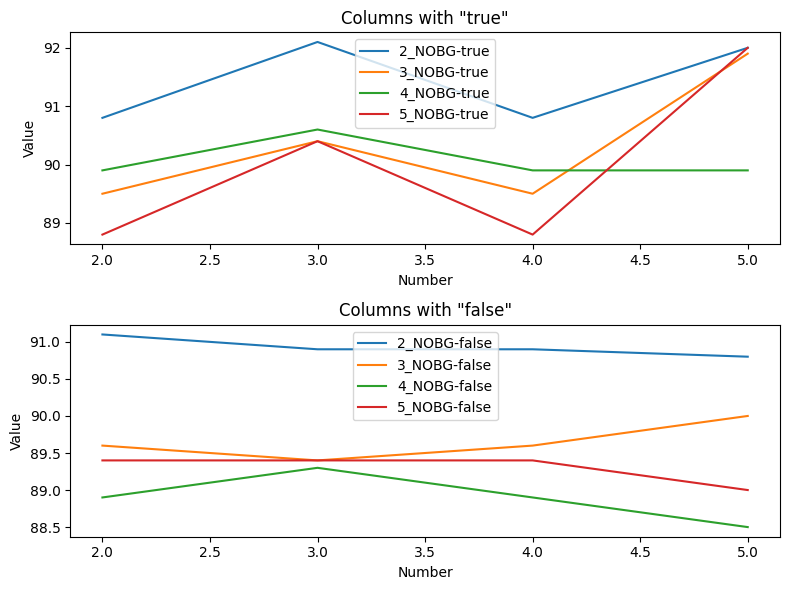

In [26]:
import matplotlib.pyplot as plt

# Data for the table
data = {
    '2_NOBG-true': [90.8, 92.1, 90.8, 92.0],
    '2_NOBG-false': [91.1, 90.9, 90.9, 90.8],
    '3_NOBG-true': [89.5, 90.4, 89.5, 91.9],
    '3_NOBG-false': [89.6, 89.4, 89.6, 90.0],
    '4_NOBG-true': [89.9, 90.6, 89.9, 89.9],
    '4_NOBG-false': [88.9, 89.3, 88.9, 88.5],
    '5_NOBG-true': [88.8, 90.4, 88.8, 92.0],
    '5_NOBG-false': [89.4, 89.4, 89.4, 89.0]
}

# Extract the data for true and false columns
true_columns = [column for column in data.keys() if 'true' in column]
false_columns = [column for column in data.keys() if 'false' in column]

# Create subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6))

# Plot for true columns
for column in true_columns:
    x = [int(name.split('_')[0]) for name in data.keys()]
    x = list(set(x))
    y = data[column]
    ax1.plot(x, y, label=column)

# Plot for false columns
for column in false_columns:
    x = [int(name.split('_')[0]) for name in data.keys()]
    x = list(set(x))
    y = data[column]
    ax2.plot(x, y, label=column)

# Set titles and labels
ax1.set_title('Columns with "true"')
ax1.set_xlabel('Number')
ax1.set_ylabel('Value')
ax1.legend()

ax2.set_title('Columns with "false"')
ax2.set_xlabel('Number')
ax2.set_ylabel('Value')
ax2.legend()

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


* Full parece funcionar de mejor manera que Partial.
* Full funciona mejor cuando eliminamos el 20% mas pequenho de gradientes que los mas importantes.
* Random tiene un comportamiento no consistente, probablemente por distintos  valores de inicializacion a los que lleva.

In [6]:
%%time
from copy import deepcopy
envs = ['nobg','images']
n_envs = len(envs)
splits = ['train','val']
n_splits = len(splits)
env = 'nobg'
# get data first



all_data = dict()

for n_inter in range(2,6):
    for asc in ['true','false']:
        all_data[env] = dict()
        experiments = api.query(COMET_WORKSPACE, 'spur', 
                          (Parameter('model') == 'scnn')
                          & (Parameter('task_dataset_name') == 'synmnist') 
                          & (Parameter('load_pretrained') == 'false')
                          & (Parameter('frozen_features') == 'false') 
                          & (Parameter('task_dataset_baseline') == 'false')
                          & (Parameter('task_n_interventions') == f"{n_inter}")
                          & (Parameter('forget_asc') == asc)
                          & (Parameter('after_training') == "true")
                          & (Parameter('task_dataset_bg') == 'nobg') 
                           )

        E = group_experiments(experiments, 'forget_method')
        print(len(experiments))
        for j, split in enumerate(splits):
            # Get split data
            all_data[env][split] = process_data(E, [f'task_{split}_acc'])

        dfs[f'baseline_forget_hyper_{n_inter}_{asc}_MNIST'] = deepcopy(all_data)

4
4
4
4
4
4
4
4
CPU times: user 16.6 s, sys: 588 ms, total: 17.2 s
Wall time: 15min 43s


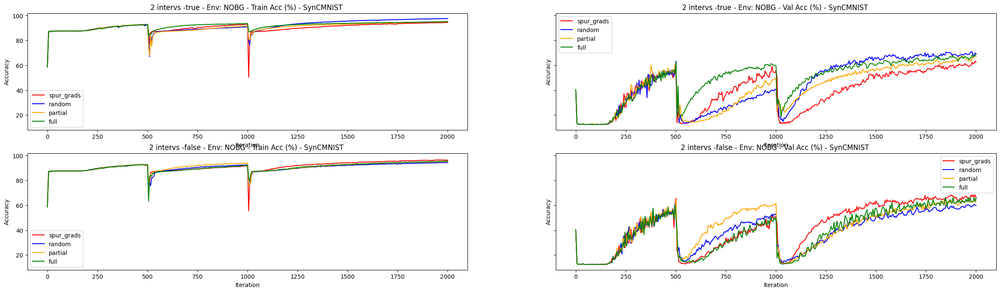

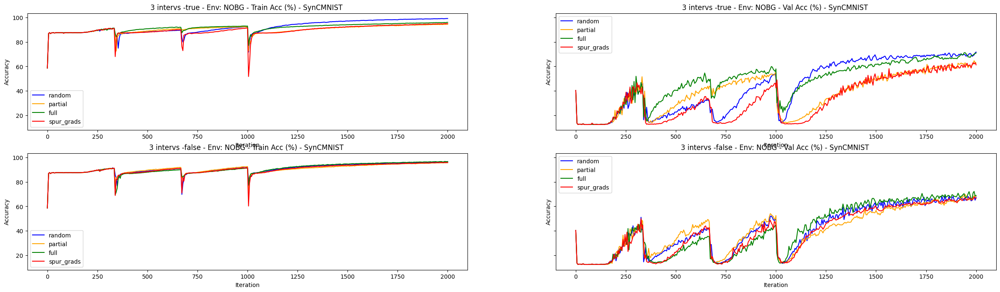

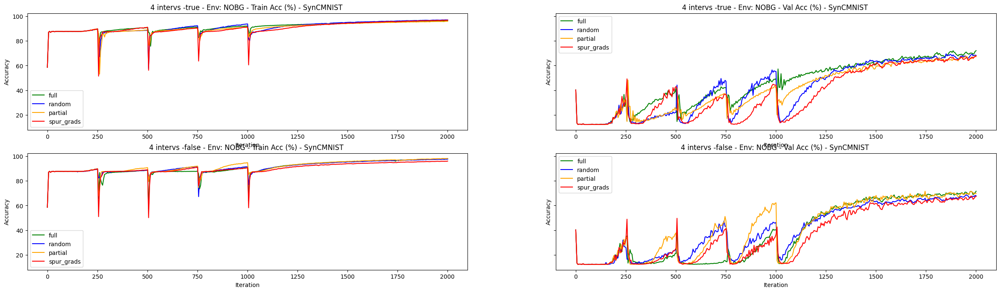

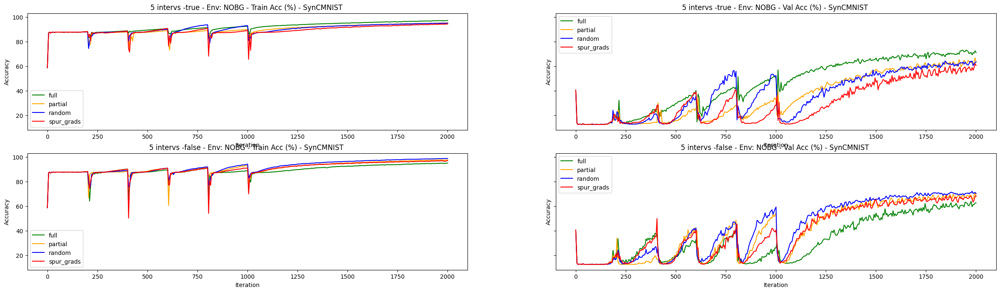

In [7]:
env = "nobg"
splits = ['train','val']
n_splits = len(splits)
ylabel = 'Accuracy'
# plot data
colors = {'random': 'blue', 'full': 'green', 'partial': 'orange', 'spur_grads': 'red'}
for n_inter in range(2,6):
    fig, axs = plt.subplots(2, n_splits,figsize=(30, 4*n_splits), constrained_layout=False, sharey=True)

    for i, asc in enumerate(['true','false']):
        all_data = dfs[f'baseline_forget_hyper_{n_inter}_{asc}_MNIST'] 
        for j, split in enumerate(splits):
            data = all_data[env][split]
            xvals = data[0]
            means = data[1]
            stds = data[2]
            captions = [k for k in data[-1]]

            for x, y, std,c in zip(xvals, means, stds,captions):
                #for n in range(1, 11):
                #    axs[i,j].axvspan((n-1)*100, n*100, ymin=0, ymax=100, color=['lightblue','white'][n%2])
                axs[i,j].plot(x, y,label=c, color=colors[c])
                axs[i,j].fill_between(x, y - std, y + std, alpha=0.2)

               #     axs[i,j].axvline(x=n*100, ls='--')

            # Add labels and title
            axs[i,j].set_xlabel('Iteration')
            axs[i,j].set_ylabel(ylabel)
            axs[i,j].set_title(f"{n_inter} intervs -{asc} - Env: {env.upper()} - {split.capitalize()} Acc (%) - SynCMNIST ")
            axs[i,j].legend()

In [ ]:

for n_inter in range(2,6):
    for asc in ['true','false']:
        
        all_data = dfs[f'baseline_forget_hyper_{n_inter}_{asc}_MNIST'] 
        print(f"{n_inter}_{env.upper()}-{asc}")
        df = create_table(all_data[env]['train'], all_data[env]['val'])
        df = df.style.format({'train': '{:,.1f}%'.format,
                              'test': '{:,.1f}%'.format,
                              'delta': '{:,.1f}%'.format,
                              'slowdown': '{:,.1f}%'.format})
        display(HTML(df.to_html()))

|              | 2_NOBG-true | 2_NOBG-false | 3_NOBG-true | 3_NOBG-false | 4_NOBG-true | 4_NOBG-false | 5_NOBG-true | 5_NOBG-false |
|--------------|-------------|--------------|-------------|--------------|-------------|--------------|-------------|--------------|
| spur_grads   | 90.8%       | 91.1%        | 89.5%       | 89.6%        | 89.9%       | 88.9%        | 88.8%       | 89.4%       |
| partial      | **92.1%**       | 90.9%        | 90.4%       | 89.4%        | 90.6%       | 89.3%        | 90.4%       | 89.4%        |
| random       | 90.8%       | 90.9%        | 89.5%       | 89.6%        | 89.9%       | 88.9%        | 88.8%       | 89.4%        |
| full         | **92.0%**       | 90.8%        | **91.9%**       | 90.0%        | 89.9%       | 88.5%        | **92.0%**       | 89.0%        |
| **baseline** | **91.9%**   | **91.9%**    | **91.9%**   | **91.9%**    | **91.9%**   | **91.9%**    | **91.9%**   | **91.9%**    |


In [12]:
%%time
from copy import deepcopy
envs = ['nobg','images']
n_envs = len(envs)
splits = ['train','val']
n_splits = len(splits)
env = 'images'
# get data first

all_data = dict()

for n_inter in range(2,6):
    for asc in ['true','false']:
        all_data[env] = dict()
        experiments = api.query(COMET_WORKSPACE, 'spur', 
                          (Parameter('model') == 'scnn')
                          & (Parameter('task_dataset_name') == 'synmnist') 
                          & (Parameter('load_pretrained') == 'false')
                          & (Parameter('frozen_features') == 'false') 
                          & (Parameter('task_dataset_baseline') == 'false')
                          & (Parameter('task_n_interventions') == f"{n_inter}")
                          & (Parameter('forget_asc') == asc)
                          & (Parameter('after_training') == "true")
                          & (Parameter('task_dataset_bg') == env)                          )

        E = group_experiments(experiments, 'forget_method')
        print(len(experiments))
        for j, split in enumerate(splits):
            # Get split data
            all_data[env][split] = process_data(E, [f'task_{split}_acc'])

        dfs[f'baseline_forget_hyper_{n_inter}_{asc}_MNIST'] = deepcopy(all_data)

4
4
4
4
4
4
4
4
CPU times: user 19.1 s, sys: 710 ms, total: 19.8 s
Wall time: 16min 7s


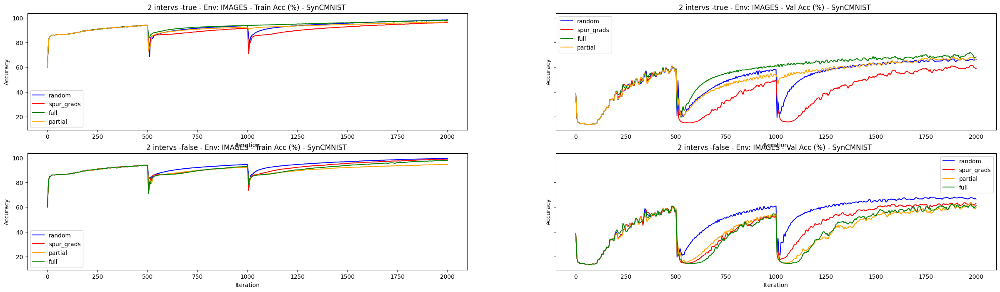

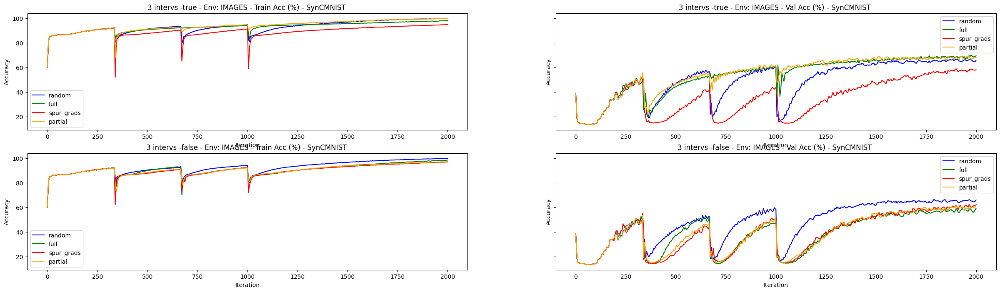

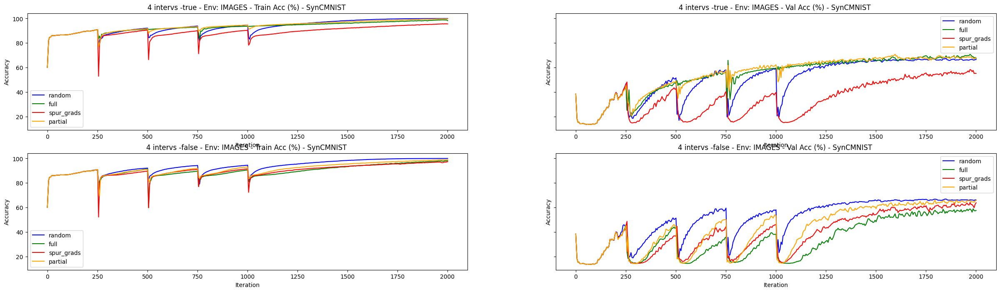

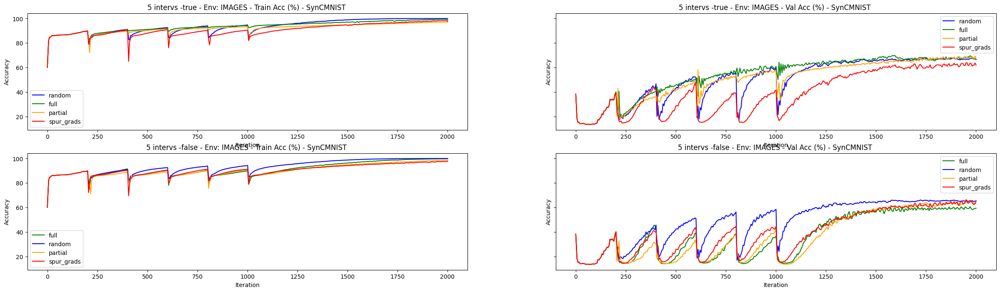

In [13]:
env = "images"
splits = ['train','val']
n_splits = len(splits)
ylabel = 'Accuracy'
# plot data
colors = {'random': 'blue', 'full': 'green', 'partial': 'orange', 'spur_grads': 'red'}
for n_inter in range(2,6):
    fig, axs = plt.subplots(2, n_splits,figsize=(30, 4*n_splits), constrained_layout=False, sharey=True)

    for i, asc in enumerate(['true','false']):
        all_data = dfs[f'baseline_forget_hyper_{n_inter}_{asc}_MNIST'] 
        for j, split in enumerate(splits):
            data = all_data[env][split]
            xvals = data[0]
            means = data[1]
            stds = data[2]
            captions = [k for k in data[-1]]

            for x, y, std,c in zip(xvals, means, stds,captions):
                #for n in range(1, 11):
                #    axs[i,j].axvspan((n-1)*100, n*100, ymin=0, ymax=100, color=['lightblue','white'][n%2])
                axs[i,j].plot(x, y,label=c, color=colors[c])
                axs[i,j].fill_between(x, y - std, y + std, alpha=0.2)

               #     axs[i,j].axvline(x=n*100, ls='--')

            # Add labels and title
            axs[i,j].set_xlabel('Iteration')
            axs[i,j].set_ylabel(ylabel)
            axs[i,j].set_title(f"{n_inter} intervs -{asc} - Env: {env.upper()} - {split.capitalize()} Acc (%) - SynCMNIST ")
            axs[i,j].legend()

In [14]:
for method in ['random','full','partial','spur_grads']:
    for asc in ['true','false']:
        
        all_data = dfs[f'baseline_forget_hyper_{n_inter}_{asc}_MNIST'] 
        print(f"{method}-{env.upper()}")
        df = create_table(all_data[env]['train'], all_data[env]['val'])
        df = df.style.format({'train': '{:,.1f}%'.format,
                              'test': '{:,.1f}%'.format,
                              'delta': '{:,.1f}%'.format,
                              'slowdown': '{:,.1f}%'.format})
        display(HTML(df.to_html()))

random-IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
random,100.0%,67.7%,32.3%,350,2000,471.4%
full,99.4%,69.8%,29.6%,375,2000,433.3%
partial,97.1%,69.4%,27.7%,475,2000,321.1%
spur_grads,98.3%,64.0%,34.3%,370,2000,440.5%


random-IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
full,99.8%,60.7%,39.1%,365,2000,447.9%
random,100.0%,66.1%,33.9%,360,2000,455.6%
partial,98.6%,64.9%,33.7%,800,2000,150.0%
spur_grads,97.7%,66.4%,31.3%,385,2000,419.5%


full-IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
random,100.0%,67.7%,32.3%,350,2000,471.4%
full,99.4%,69.8%,29.6%,375,2000,433.3%
partial,97.1%,69.4%,27.7%,475,2000,321.1%
spur_grads,98.3%,64.0%,34.3%,370,2000,440.5%


full-IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
full,99.8%,60.7%,39.1%,365,2000,447.9%
random,100.0%,66.1%,33.9%,360,2000,455.6%
partial,98.6%,64.9%,33.7%,800,2000,150.0%
spur_grads,97.7%,66.4%,31.3%,385,2000,419.5%


partial-IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
random,100.0%,67.7%,32.3%,350,2000,471.4%
full,99.4%,69.8%,29.6%,375,2000,433.3%
partial,97.1%,69.4%,27.7%,475,2000,321.1%
spur_grads,98.3%,64.0%,34.3%,370,2000,440.5%


partial-IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
full,99.8%,60.7%,39.1%,365,2000,447.9%
random,100.0%,66.1%,33.9%,360,2000,455.6%
partial,98.6%,64.9%,33.7%,800,2000,150.0%
spur_grads,97.7%,66.4%,31.3%,385,2000,419.5%


spur_grads-IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
random,100.0%,67.7%,32.3%,350,2000,471.4%
full,99.4%,69.8%,29.6%,375,2000,433.3%
partial,97.1%,69.4%,27.7%,475,2000,321.1%
spur_grads,98.3%,64.0%,34.3%,370,2000,440.5%


spur_grads-IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
full,99.8%,60.7%,39.1%,365,2000,447.9%
random,100.0%,66.1%,33.9%,360,2000,455.6%
partial,98.6%,64.9%,33.7%,800,2000,150.0%
spur_grads,97.7%,66.4%,31.3%,385,2000,419.5%


## Conclusions from hyper parameter search:

* Forgetting the

In [4]:
%%time
from copy import deepcopy
envs = ['nobg','images']
n_envs = len(envs)
n_splits = len(splits)
env = 'nobg'
# get data first



all_data = dict()

for n_inter in range(2,6):
    for asc in ['true','false']:
        all_data[env] = dict()
        experiments = api.query(COMET_WORKSPACE, 'spur', 
                          (Parameter('model') == 'scnn')
                          & (Parameter('task_dataset_name') == 'synmnist') 
                          & (Parameter('load_pretrained') == 'false')
                          & (Parameter('frozen_features') == 'false') 
                          & (Parameter('task_dataset_baseline') == 'false')
                          & (Parameter('task_n_interventions') == f"{n_inter}")
                          & (Parameter('forget_asc') == asc)
                          & (Parameter('after_training') == "true")
                          & (Parameter('task_dataset_bg') == 'nobg') 
                          & (Parameter('task_dataset_p') == '0.875') 
                           )

        E = group_experiments(experiments, 'forget_method')
        print(len(experiments))
        for j, split in enumerate(splits):
            # Get split data
            all_data[env][split] = process_data(E, [f'task_{split}_acc'])

        dfs[f'baseline_forget_hyper_{n_inter}_{asc}_MNIST'] = deepcopy(all_data)

4
4
4
4
4
4
4
4
CPU times: user 18.1 s, sys: 715 ms, total: 18.9 s
Wall time: 16min 16s


In [ ]:
%%time
envs = ['nobg','gradient','images']
n_envs = len(envs)
n_splits = len(splits)

# get data first


for n_layer in [1,2]:
    all_data = dict()
    for i, env in enumerate(envs):
        all_data[env] = dict()
        experiments = api.query(COMET_WORKSPACE, 'spur', 
                          (Parameter('model') == 'scnn')
                          & (Parameter('task_dataset_name') == 'synmnist') 
                          & (Parameter('load_pretrained') == 'false')
                          & (Parameter('frozen_features') == 'false') 
                          & (Parameter('task_dataset_baseline') == 'false')
                          & (Parameter('task_n_interventions') == '10')
                          & (Parameter('n_layers') == f'{n_layer}')
                          & (Parameter('task_dataset_bg') == env) 
                           )

        E = group_experiments(experiments, 'task_dataset_p')
        print(len(experiments))
        for j, split in enumerate(splits):
            # Get split data
            all_data[env][split] = process_data(E, [f'task_{split}_acc'])
    
    dfs[f'baseline_forget_{n_layer}layer_MNIST'] = all_data

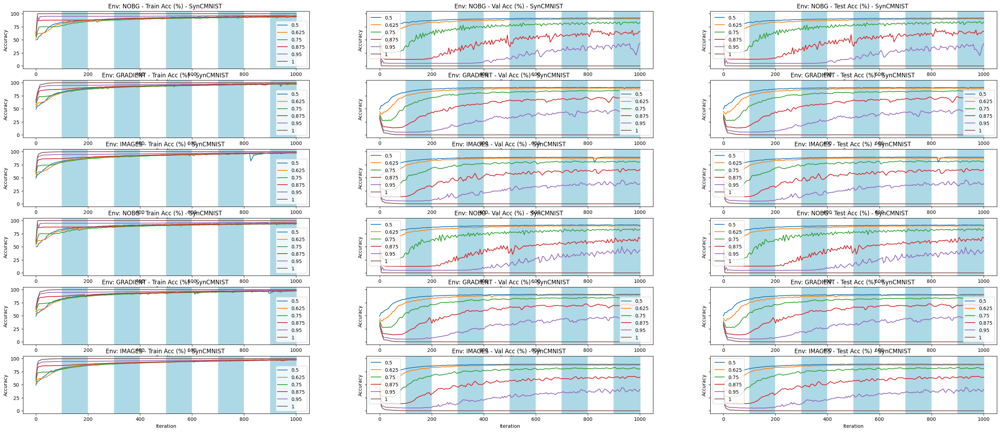

In [28]:
fig, axs = plt.subplots(2*n_envs, n_splits,figsize=(2*n_envs*6, n_splits*5), constrained_layout=False, sharey=True)
ylabel = 'Accuracy'
# plot data
for n_layer in [1,2]:
    all_data = dfs[f'baseline_forget_{n_layer}layer_MNIST'] 
    for i, env in enumerate(envs):
        for j, split in enumerate(splits):
            data = all_data[env][split]
            xvals = data[0]
            means = data[1]
            stds = data[2]
            captions = [k for k in data[-1]]

            for x, y, std,c in zip(xvals, means, stds,captions):
                for n in range(1, 11):
                    axs[i+3*(n_layer-1),j].axvspan((n-1)*100, n*100, ymin=0, ymax=100, color=['lightblue','white'][n%2])
                axs[i+3*(n_layer-1),j].plot(x, y,label=c)
                axs[i+3*(n_layer-1),j].fill_between(x, y - std, y + std, alpha=0.2)

               #     axs[i,j].axvline(x=n*100, ls='--')

            # Add labels and title
            axs[i+3*(n_layer-1),j].set_xlabel('Iteration')
            axs[i+3*(n_layer-1),j].set_ylabel(ylabel)
            axs[i+3*(n_layer-1),j].set_title(f"Env: {env.upper()} - {split.capitalize()} Acc (%) - SynCMNIST ")
            axs[i+3*(n_layer-1),j].legend()

In [29]:
for n_layer in [1,2]:
    all_data = dfs[f'baseline_forget_{n_layer}layer_MNIST'] 
    for env in envs:
        print(f"{n_layer}-{env.upper()}")
        df = create_table(all_data[env]['train'], all_data[env]['test'], pretrained=False)
        df = df.style.format({'train': '{:,.1f}%'.format,
                              'test': '{:,.1f}%'.format,
                              'delta': '{:,.1f}%'.format,
                              'slowdown': '{:,.1f}%'.format})
        display(HTML(df.to_html()))

1-NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,96.0%,91.6%,4.4%,295,420,42.4%
0.250000,95.3%,90.4%,4.9%,335,755,125.4%
0.500000,94.1%,85.1%,8.9%,430,1000,132.6%
0.750000,94.7%,71.2%,23.5%,315,1000,217.5%
0.900000,96.7%,42.5%,54.2%,5,1000,"19,900.0%"
1.000000,100.0%,38.1%,61.9%,5,1000,"19,900.0%"


1-GRADIENT


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,98.4%,90.8%,7.7%,235,385,63.8%
0.250000,97.9%,89.6%,8.4%,275,1000,263.6%
0.500000,97.3%,84.7%,12.6%,270,1000,270.4%
0.750000,98.0%,73.3%,24.7%,185,1000,440.5%
0.900000,98.7%,50.5%,48.2%,15,1000,"6,566.7%"
1.000000,100.0%,31.9%,68.1%,15,1000,"6,566.7%"


1-IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,98.3%,89.6%,8.6%,265,1000,277.4%
0.250000,98.6%,88.0%,10.6%,285,1000,250.9%
0.500000,97.4%,82.8%,14.6%,320,1000,212.5%
0.750000,97.7%,67.8%,29.9%,220,1000,354.5%
0.900000,98.5%,45.6%,52.9%,10,1000,"9,900.0%"
1.000000,100.0%,34.1%,65.9%,5,1000,"19,900.0%"


2-NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,96.0%,91.7%,4.3%,280,395,41.1%
0.250000,95.8%,90.6%,5.2%,325,715,120.0%
0.500000,93.9%,84.9%,9.0%,440,1000,127.3%
0.750000,94.5%,68.2%,26.3%,330,1000,203.0%
0.900000,97.0%,49.0%,48.0%,5,1000,"19,900.0%"
1.000000,100.0%,38.1%,61.9%,5,1000,"19,900.0%"


2-GRADIENT


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,98.3%,90.8%,7.6%,235,385,63.8%
0.250000,97.7%,89.4%,8.3%,270,1000,270.4%
0.500000,97.5%,84.6%,12.9%,275,1000,263.6%
0.750000,97.9%,73.4%,24.5%,180,1000,455.6%
0.900000,98.8%,52.4%,46.3%,15,1000,"6,566.7%"
1.000000,100.0%,31.9%,68.1%,15,1000,"6,566.7%"


2-IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.000000,98.2%,89.4%,8.8%,280,1000,257.1%
0.250000,98.5%,88.1%,10.4%,275,1000,263.6%
0.500000,97.5%,83.3%,14.2%,320,1000,212.5%
0.750000,97.6%,66.1%,31.4%,220,1000,354.5%
0.900000,98.5%,44.7%,53.8%,10,1000,"9,900.0%"
1.000000,100.0%,34.1%,65.9%,5,1000,"19,900.0%"


  	train 	test 	delta 	time to 90% - train 	time to 90% - test 	slowdown
0.000000 	96.1% 	91.9% 	4.1% 	295 	405 	37.3%
0.250000 	95.5% 	90.6% 	4.9% 	340 	760 	123.5%
0.500000 	93.9% 	84.4% 	9.5% 	440 	1000 	127.3%
0.750000 	94.5% 	68.6% 	25.9% 	345 	1000 	189.9%
0.900000 	97.0% 	49.5% 	47.5% 	5 	1000 	19,900.0%
1.000000 	100.0% 	38.1% 	61.9% 	5 	1000 	19,900.0%

## Forgetting Highest Gradients

In [12]:
%%time
envs = ['nobg','gradient','images']
n_envs = len(envs)
n_splits = len(splits)

# get data first

for method in ['full', 'partial']:
    all_data = dict()
    for i, env in enumerate(envs):
        all_data[env] = dict()
        experiments = api.query(COMET_WORKSPACE, 'spur', 
                          (Parameter('model') == 'scnn')
                          & (Parameter('task_dataset_name') == 'synmnist') 
                          & (Parameter('load_pretrained') == 'false')
                          & (Parameter('frozen_features') == 'false') 
                          & (Parameter('task_dataset_baseline') == 'false')
                          & (Parameter('task_n_interventions') == '10')
                          & (Parameter('task_dataset_bg') == env)
                          & (Parameter('forget_method') == method)
                          & (Parameter('forget_amount') == 'session') 
                           )

        E = group_experiments(experiments, 'forget_threshold')
        print(len(experiments))
        for j, split in enumerate(splits):
            # Get split data
            all_data[env][split] = process_data(E, [f'task_{split}_acc'])

    dfs[f'baseline_forget_session_{method}_MNIST'] = all_data



11
11
11
11
11
11
CPU times: user 2.55 s, sys: 39.3 ms, total: 2.59 s
Wall time: 1min 39s


In [23]:
for method in ['random']:
    all_data = dict()
    for i, env in enumerate(envs):
        all_data[env] = dict()
        experiments = api.query(COMET_WORKSPACE, 'spur', 
                          (Parameter('model') == 'scnn')
                          & (Parameter('task_dataset_name') == 'synmnist') 
                          & (Parameter('load_pretrained') == 'false')
                          & (Parameter('frozen_features') == 'false') 
                          & (Parameter('task_dataset_baseline') == 'false')
                          & (Parameter('task_n_interventions') == '10')
                          & (Parameter('task_dataset_bg') == env)
                          & (Parameter('forget_method') == method)
 
                           )

        E = group_experiments(experiments, 'forget_threshold')
        print(len(experiments))
        for j, split in enumerate(splits):
            # Get split data
            all_data[env][split] = process_data(E, [f'task_{split}_acc'])

    dfs[f'baseline_forget_{method}_MNIST'] = all_data

11
11
11


In [28]:
def plot_forget(method):
    fig, axs = plt.subplots(n_envs, n_splits,figsize=(n_envs*6, n_splits*5), constrained_layout=False, sharey=True)
    ylabel = 'Accuracy'
    # plot data
    all_data = dfs[f'baseline_forget_{method}_MNIST'] 
    for i, env in enumerate(envs):
        for j, split in enumerate(splits):
            data = all_data[env][split]
            xvals = data[0]
            means = data[1]
            stds = data[2]
            captions = [k for k in data[-1]]

            for x, y, std,c in zip(xvals, means, stds,captions):
                for n in range(1, 11):
                    axs[i,j].axvspan((n-1)*100, n*100, ymin=0, ymax=100, color=['lightblue','white'][n%2])
                axs[i,j].plot(x, y,label=c)
                axs[i,j].fill_between(x, y - std, y + std, alpha=0.2)

               #     axs[i,j].axvline(x=n*100, ls='--')

            # Add labels and title
            axs[i,j].set_xlabel('Iteration')
            axs[i,j].set_ylabel(ylabel)
            axs[i,j].set_title(f"Env: {env.upper()} - {split.capitalize()} Acc (%) - SynCMNIST ")
            axs[i,j].legend()
            
def plot_forget_table(method):

    all_data = dfs[f'baseline_forget_{method}_MNIST'] 
    for env in envs:
        print(f{env.upper()}")
        df = create_table(all_data[env]['train'], all_data[env]['test'])
        df = df.style.format({'train': '{:,.1f}%'.format,
                              'test': '{:,.1f}%'.format,
                              'delta': '{:,.1f}%'.format,
                              'slowdown': '{:,.1f}%'.format})
        display(HTML(df.to_html()))

## Forget Random

NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.0,95.9%,92.0%,3.9%,300,400,33.3%
0.1,88.7%,86.6%,2.0%,1000,1000,0.0%
0.2,85.8%,84.3%,1.6%,1000,1000,0.0%
0.3,84.8%,83.4%,1.4%,1000,1000,0.0%
0.4,83.4%,83.4%,0.0%,1000,1000,0.0%
0.5,82.5%,82.4%,0.1%,1000,1000,0.0%
0.6,83.7%,83.7%,0.0%,1000,1000,0.0%
0.7,82.7%,82.8%,-0.0%,1000,1000,0.0%
0.8,82.6%,82.8%,-0.2%,1000,1000,0.0%
0.9,83.0%,83.2%,-0.1%,1000,1000,0.0%


GRADIENT


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.0,98.3%,90.7%,7.6%,245,395,61.2%
0.1,91.2%,87.6%,3.7%,885,1000,13.0%
0.2,86.2%,84.2%,2.0%,1000,1000,0.0%
0.3,83.5%,82.2%,1.3%,1000,1000,0.0%
0.4,82.6%,82.0%,0.6%,1000,1000,0.0%
0.5,82.7%,82.3%,0.5%,1000,1000,0.0%
0.6,82.3%,81.9%,0.4%,1000,1000,0.0%
0.7,82.0%,81.5%,0.5%,1000,1000,0.0%
0.8,82.6%,82.1%,0.4%,1000,1000,0.0%
0.9,82.8%,82.3%,0.6%,1000,1000,0.0%


IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.0,98.3%,89.6%,8.7%,265,1000,277.4%
0.1,91.9%,87.7%,4.2%,695,1000,43.9%
0.2,87.4%,84.2%,3.2%,1000,1000,0.0%
0.3,81.9%,81.0%,0.9%,1000,1000,0.0%
0.4,81.9%,81.1%,0.8%,1000,1000,0.0%
0.5,82.0%,81.1%,1.0%,1000,1000,0.0%
0.6,81.8%,80.8%,1.0%,1000,1000,0.0%
0.7,81.6%,80.7%,0.9%,1000,1000,0.0%
0.8,81.6%,80.6%,1.0%,1000,1000,0.0%
0.9,81.7%,80.6%,1.1%,1000,1000,0.0%


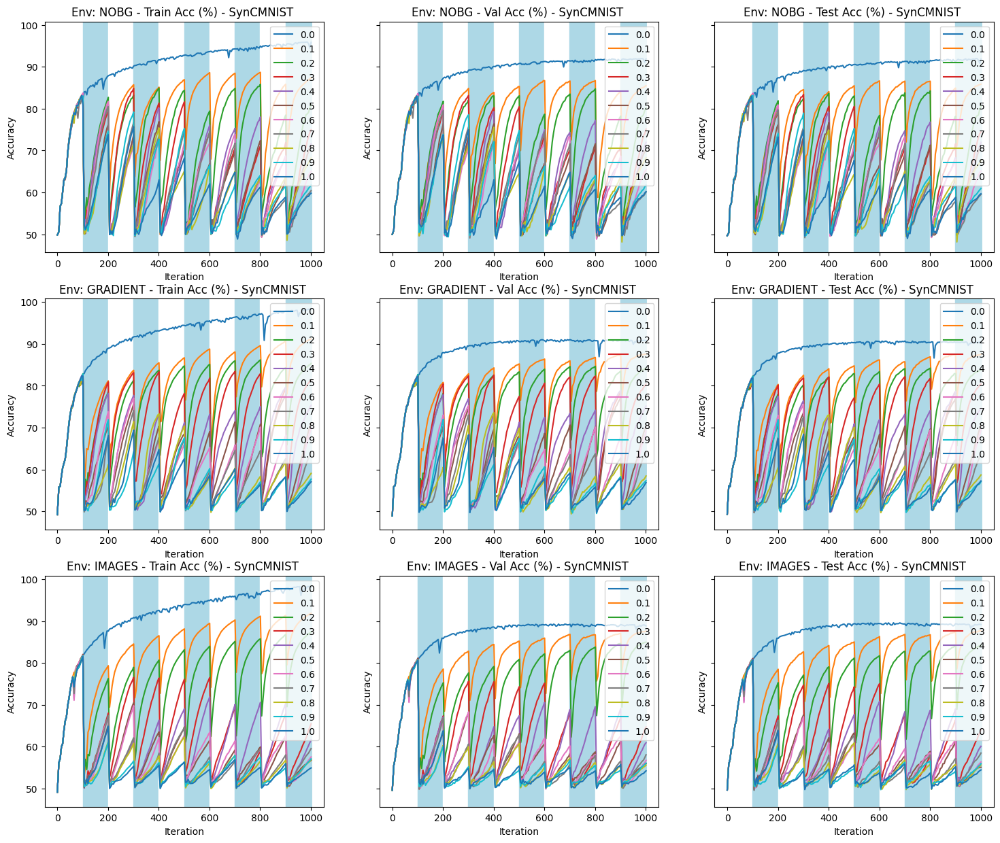

In [29]:
plot_forget('random')
plot_forget_table('random')

## Forget Full

NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.0,96.0%,91.9%,4.1%,295,405,37.3%
0.1,83.5%,83.4%,0.2%,1000,1000,0.0%
0.2,82.7%,82.8%,-0.2%,1000,1000,0.0%
0.3,83.7%,83.6%,0.1%,1000,1000,0.0%
0.4,83.0%,83.2%,-0.2%,1000,1000,0.0%
0.5,82.7%,82.8%,-0.1%,1000,1000,0.0%
0.6,82.8%,83.0%,-0.1%,1000,1000,0.0%
0.7,82.7%,82.7%,0.0%,1000,1000,0.0%
0.8,83.5%,83.5%,-0.0%,1000,1000,0.0%
0.9,83.7%,83.6%,0.1%,1000,1000,0.0%


GRADIENT


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.0,98.2%,90.7%,7.5%,230,405,76.1%
0.1,82.8%,82.2%,0.7%,1000,1000,0.0%
0.2,82.8%,82.3%,0.5%,1000,1000,0.0%
0.3,82.5%,81.8%,0.7%,1000,1000,0.0%
0.4,82.1%,81.1%,0.9%,1000,1000,0.0%
0.5,82.0%,81.0%,1.0%,1000,1000,0.0%
0.6,82.7%,81.9%,0.8%,1000,1000,0.0%
0.7,82.8%,82.2%,0.7%,1000,1000,0.0%
0.8,81.8%,81.5%,0.4%,1000,1000,0.0%
0.9,82.0%,81.4%,0.6%,1000,1000,0.0%


IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.0,98.4%,89.6%,8.8%,280,1000,257.1%
0.1,81.6%,80.8%,0.9%,1000,1000,0.0%
0.2,82.1%,81.1%,1.0%,1000,1000,0.0%
0.3,81.8%,81.0%,0.8%,1000,1000,0.0%
0.4,81.7%,80.9%,0.8%,1000,1000,0.0%
0.5,81.8%,81.0%,0.8%,1000,1000,0.0%
0.6,81.5%,80.8%,0.7%,1000,1000,0.0%
0.7,81.8%,80.9%,0.9%,1000,1000,0.0%
0.8,81.6%,80.6%,1.0%,1000,1000,0.0%
0.9,81.6%,80.6%,1.0%,1000,1000,0.0%


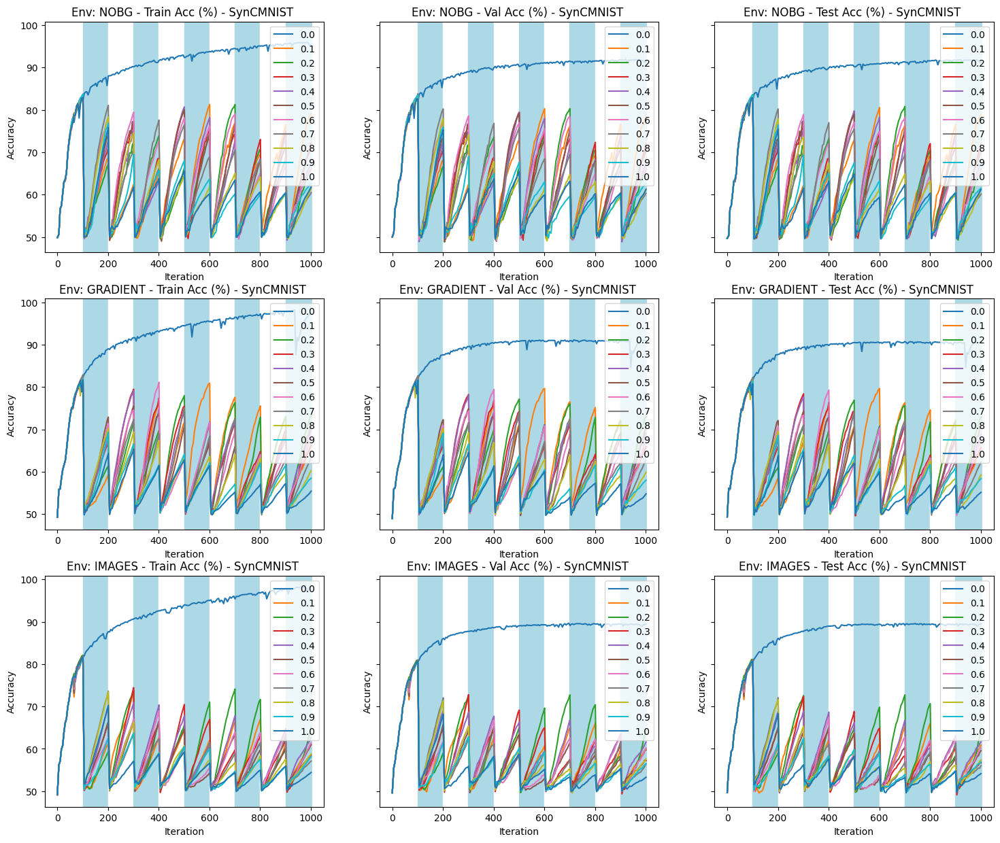

In [20]:
plot_forget('full')
plot_forget_table('full')

## Forget Partial

NOBG


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.0,95.8%,91.7%,4.1%,295,435,47.5%
0.1,82.9%,83.0%,-0.1%,1000,1000,0.0%
0.2,83.2%,83.2%,0.0%,1000,1000,0.0%
0.3,83.5%,83.5%,0.1%,1000,1000,0.0%
0.4,83.1%,83.1%,-0.1%,1000,1000,0.0%
0.5,82.8%,83.0%,-0.1%,1000,1000,0.0%
0.6,83.4%,83.3%,0.1%,1000,1000,0.0%
0.7,83.7%,83.6%,0.0%,1000,1000,0.0%
0.8,83.2%,83.2%,-0.0%,1000,1000,0.0%
0.9,83.2%,83.1%,0.1%,1000,1000,0.0%


GRADIENT


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.0,98.3%,90.7%,7.7%,230,385,67.4%
0.1,82.7%,82.0%,0.7%,1000,1000,0.0%
0.2,82.6%,82.1%,0.5%,1000,1000,0.0%
0.3,82.5%,81.8%,0.7%,1000,1000,0.0%
0.4,82.1%,81.2%,0.9%,1000,1000,0.0%
0.5,82.7%,82.2%,0.5%,1000,1000,0.0%
0.6,82.2%,81.6%,0.5%,1000,1000,0.0%
0.7,82.8%,82.0%,0.8%,1000,1000,0.0%
0.8,82.0%,81.5%,0.5%,1000,1000,0.0%
0.9,82.6%,82.0%,0.6%,1000,1000,0.0%


IMAGES


,train,test,delta,time to 90% - train,time to 90% - test,slowdown
0.0,98.4%,89.7%,8.8%,265,1000,277.4%
0.1,81.8%,80.7%,1.1%,1000,1000,0.0%
0.2,81.8%,80.9%,0.9%,1000,1000,0.0%
0.3,81.6%,80.6%,1.0%,1000,1000,0.0%
0.4,81.8%,81.0%,0.8%,1000,1000,0.0%
0.5,81.7%,80.9%,0.9%,1000,1000,0.0%
0.6,81.8%,80.9%,0.8%,1000,1000,0.0%
0.7,81.7%,80.9%,0.7%,1000,1000,0.0%
0.8,81.8%,80.8%,1.1%,1000,1000,0.0%
0.9,81.8%,80.9%,0.9%,1000,1000,0.0%


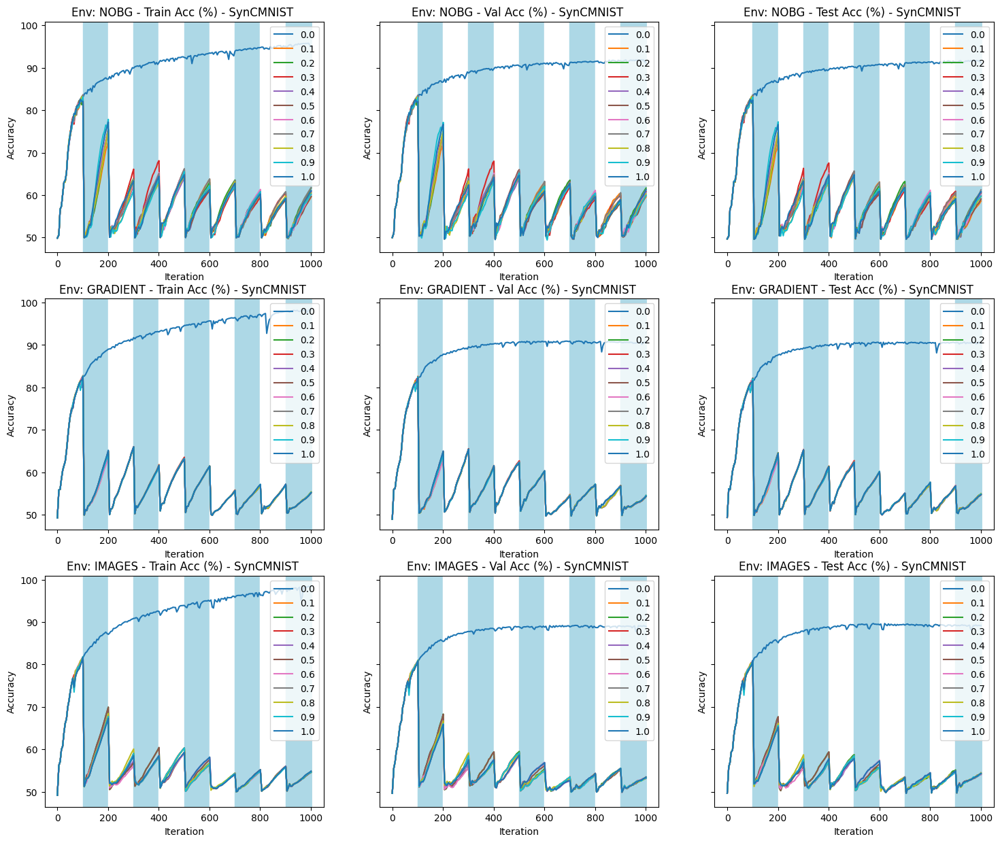

In [21]:
plot_forget('partial')
plot_forget_table('partial')

## Camelyon17 Baselines

In [9]:
%%time

dfs = dict()
# get data first
splits = ['id_val','val','test']

all_data = dict()

experiments = api.query(COMET_WORKSPACE, 'spur', 
                  (Parameter('model') == 'densenet')
                  & (Parameter('task_dataset_name') == 'camelyon') 
            #      & (Parameter('load_pretrained') == 'false')
            #      & (Parameter('frozen_features') == 'false') 
            #      & (Parameter('task_dataset_baseline') == 'false')
            #      & (Parameter('task_n_interventions') == '10')
            #      & (Parameter('task_dataset_bg') == env)
            #      & (Parameter('forget_method') == method)
            #      & (Parameter('forget_amount') == 'session') 
                   )

E = group_experiments(experiments, 'forget_threshold')
print(len(experiments))
for j, split in enumerate(splits):
    # Get split data
    all_data[split] = process_data(E, [f'task_{split}_acc'])

dfs[f'baseline_forget_session_Camelyon'] = all_data

10
CPU times: user 274 ms, sys: 14.2 ms, total: 288 ms
Wall time: 8.81 s


### Best iteration for seed of Camelyon17 for Densenet

In [37]:
r = defaultdict(list) 
for e in experiments:
    res = get_metric(e,'task_val_acc')
    max_acc = 0
    for m in res:
        if float(m[0]) > max_acc:
            max_acc = float(m[0])
            max_id = m[1]
    r['seed'].append(get_parameter_value(e,'seed'))
    r['acc'].append(max_acc)
    r['iteration'].append(max_id)
    
pd.DataFrame.from_dict(r).sort_values('seed')

,seed,acc,iteration
0,111,87.580215,22001
8,123,87.161926,42001
3,222,86.150581,20001
6,333,87.434097,32001
9,444,86.651955,35001
1,555,86.863968,28001
4,666,86.482925,38001
7,777,88.167542,31001
2,888,87.972725,35001
5,999,87.680496,47001


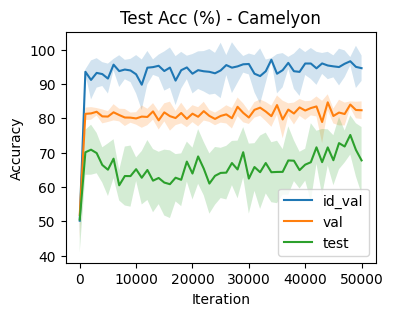

In [41]:
fig, axs = plt.subplots(nrows=1, ncols=1,sharex=True,sharey=True,figsize=(4,3))

all_data = dfs[f'baseline_forget_session_Camelyon'] 
for j, split in enumerate(splits):
    data = all_data[split]
    xvals = data[0]
    means = data[1]
    stds = data[2]
    captions = [k for k in data[-1]]

    for x, y, std,c in zip(xvals, means, stds,captions):
        #for n in range(1, 11):
        #    axs[i,j].axvspan((n-1)*100, n*100, ymin=0, ymax=100, color=['lightblue','white'][n%2])
        axs.plot(x, y,label=split)#, color=colors[c])
        axs.fill_between(x, y - std, y + std, alpha=0.2)
       #     axs[i,j].axvline(x=n*100, ls='--')

    # Add labels and title
    axs.set_xlabel('Iteration')
    axs.set_ylabel("Accuracy")
    axs.set_title(f"{split.capitalize()} Acc (%) - Camelyon")
    axs.legend()

### dfs